## A. Configuración General.

In [1]:
#1. Librerías.
%run "./librerias.ipynb"

c:\Users\c678456\AppData\Local\anaconda3\envs\dmeyf\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
#3. Constantes.
%run "./constantes.ipynb"

In [3]:
#4. Funciones
%run "./funciones.ipynb"

In [4]:
#5. Lectura de datos.
#data = pd.read_csv(base_path + dataset_file_fe_menos_3) # Para apartado B.
#data = pd.read_csv(base_path + dataset_file_fe_menos_2) # Para apartado C.
data = pd.read_csv(base_path + dataset_file_fe_menos_3) # Para apartado D.
#.

In [5]:
#6. Pesos y reclusterización.
data['clase_peso'] = 1.0

data.loc[data['clase_ternaria'] == 'BAJA+2', 'clase_peso'] = 1.00002
data.loc[data['clase_ternaria'] == 'BAJA+1', 'clase_peso'] = 1.00001

data['clase_binaria1'] = 0
data['clase_binaria2'] = 0
data['clase_binaria1'] = np.where(data['clase_ternaria'] == 'BAJA+2', 1, 0)
data['clase_binaria2'] = np.where(data['clase_ternaria'] == 'CONTINUA', 0, 1)

## B. Train con Abril con DF -3 con ratios incluidos.

In [7]:
#1. Funcion de optimización de hiperparámetros.
def objective(trial): 
    # Rango de parámetros a buscar sus valores óptimos.
    num_leaves = trial.suggest_int('num_leaves', 10, 200)
    learning_rate = trial.suggest_float('learning_rate', 0.005, 0.3) # mas bajo, más iteraciones necesita.
    min_data_in_leaf = trial.suggest_int('min_data_in_leaf', 50, 2000)
    feature_fraction = trial.suggest_float('feature_fraction', 0.1, 1.0)
    bagging_fraction = trial.suggest_float('bagging_fraction', 0.1, 1.0)


    # Parámetros que le voy a pasar al modelo.
    params = {
        'objective': 'binary',
        'metric': 'custom',
        'boosting_type': 'gbdt',
        'first_metric_only': True,
        'boost_from_average': True,
        'feature_pre_filter': False,
        'max_bin': 31,
        'num_leaves': num_leaves,
        'learning_rate': learning_rate,
        'min_data_in_leaf': min_data_in_leaf,
        'feature_fraction': feature_fraction,
        'bagging_fraction': bagging_fraction,
        'seed': semillas[0],
        'verbose': -1
    }
    
    # Creo el dataset para Light GBM.
    train_data = lgb.Dataset(X_train,
                              label=y_train_binaria2, # eligir la clase
                              weight=w_train)
    
    # Entreno.
    cv_results = lgb.cv(
        params,
        train_data,
        num_boost_round=1000, # modificar, subit y subir... y descomentar la línea inferior
        callbacks=[lgb.early_stopping(int(50 + 5 / learning_rate))],
        feval=lgb_gan_eval,
        stratified=True,
        nfold=5,
        seed=semillas[0]
    )
    
    # Calculo la ganancia máxima y la mejor iteración donde se obtuvo dicha ganancia.
    max_gan = max(cv_results['valid gan_eval-mean'])
    best_iter = cv_results['valid gan_eval-mean'].index(max_gan) + 1

    # Guardamos cual es la mejor iteración del modelo
    trial.set_user_attr("best_iter", best_iter)

    return max_gan * 5

In [8]:
#2. Divido entre Train y Test.
train_data = data[data['foto_mes'] == mes_train_a]
test_data = data[data['foto_mes'] == mes_test]

X_train = train_data.drop(['clase_ternaria', 'clase_peso', 'clase_binaria1','clase_binaria2'], axis=1)
y_train_binaria1 = train_data['clase_binaria1']
y_train_binaria2 = train_data['clase_binaria2']
w_train = train_data['clase_peso']

X_test = test_data.drop(['clase_ternaria', 'clase_peso', 'clase_binaria1','clase_binaria2'], axis=1)
y_test_binaria1 = test_data['clase_binaria1']
y_test_class = test_data['clase_ternaria']
w_test = test_data['clase_peso']

In [ ]:
#3. Voy a realizar un estudio de Optuna para encontrar los mejores parámetros.
#i. Creo la base de datos donde guardar los resultados.
storage_name = "sqlite:///" + db_path + "optimization_lgbm.db"
study_name = "exp_731_lgbm_train_abril_menos_3_V2" # Primer dígito número de clase, segundo dígito df - cuanto, tercer dígito número de entrenamiento.

#ii. Creo el estudio.
study = optuna.create_study(
    direction="maximize",
    study_name=study_name,
    storage=storage_name,
    load_if_exists=True,
)

#iii. Corro el estudio.
study.optimize(objective, n_trials=100)

In [10]:
#4. Visualizo los resultados del estudio, para modificar los rangos de análisis.

In [ ]:
optuna.visualization.plot_optimization_history(study)

In [ ]:
plot_param_importances(study)

In [ ]:
plot_slice(study)

In [ ]:
plot_contour(study)

In [ ]:
plot_contour(study, params=['num_leaves','min_data_in_leaf'] )

In [ ]:
study.best_trial.params

In [ ]:
#5. Tomamos el mejor modelo y con eso entrenamos todos los datos.
best_iter = study.best_trial.user_attrs["best_iter"]
print(f"Mejor cantidad de árboles para el mejor model {best_iter}")
params = {
    'objective': 'binary',
    'boosting_type': 'gbdt',
    'first_metric_only': True,
    'boost_from_average': True,
    'feature_pre_filter': False,
    'max_bin': 31,
    'num_leaves': study.best_trial.params['num_leaves'],
    'learning_rate': study.best_trial.params['learning_rate'],
    'min_data_in_leaf': study.best_trial.params['min_data_in_leaf'],
    'feature_fraction': study.best_trial.params['feature_fraction'],
    'bagging_fraction': study.best_trial.params['bagging_fraction'],
    'seed': semillas[0],
    'verbose': 0
}

train_data = lgb.Dataset(X_train,
                          label=y_train_binaria2,
                          weight=w_train)

model_lgb = lgb.train(params,
                  train_data,
                  num_boost_round=best_iter)

In [ ]:
#6. Observamos las variables más importantes para el modelo.
#i. Gráfico.
lgb.plot_importance(model_lgb, figsize=(10, 20))
plt.show()

In [ ]:
#ii. Dataframe.
#a. Extract feature importance and feature names.
importance = model_lgb.feature_importance()
features = model_lgb.feature_name()

#b. Create a dataframe for better visualization.
importance_df = pd.DataFrame({'Feature': features, 'Importance': importance})

#c. Sort by importance in descending order.
importance_df = importance_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)

#d. show.
importance_df.head(100)

In [ ]:
#7. Guardamos el modelo.
model_lgb.save_model('./lgb_datos_abril_menos_3_v2.txt')
#model_lgb.save_model(modelos_path + 'lgb_datos_fe_02_ajusto_optuna.txt')

In [36]:
#8. Volvemos a leer el modelo.
model_lgb = lgb.Booster(model_file="./lgb_datos_abril_menos_3_v2.txt")
#model_lgb = lgb.Booster(model_file=modelos_path + 'lgb_datos_fe_02_ajusto_optuna.txt')

In [37]:
#a. Importo librería.
from kaggle.api.kaggle_api_extended import KaggleApi
#b. Configura el API de Kaggle
api = KaggleApi()
api.authenticate()

In [ ]:
#L. Predecimos Junio.
#i. Predecimos propiamente dicho.
predicciones = model_lgb.predict(X_test)
#ii. Le pegamos la probabilidad de ser "BAJA" a cada cliente.
X_test['Probabilidad'] = predicciones
#iii. Ordenamos a los clientes por probabilidad de ser "BAJA" de forma descendente.
tb_entrega = X_test.sort_values(by='Probabilidad', ascending=False)
#iv. Genero una lista de distintos cortes candidatos, para enviar a Kaggle.
cortes = range(9000,14000,200)
#v. Generamos las distintas predicciones de clases a partir de los distintos cortes posibles.
num_subida_kaggle = 1
for envios in cortes:
    #1. Le ponemos clase 1 ("BAJA") a los primeros "envios" con mayor probabilidad.
    tb_entrega['Predicted'] = 0
    tb_entrega.iloc[:envios, tb_entrega.columns.get_loc('Predicted')] = 1
    resultados = tb_entrega[["numero_de_cliente", 'Predicted']].reset_index(drop=True)
    
    print("Cantidad de clientes {}".format(envios))
    #2. Guardamos el archivo para Kaggle.
    nombre_archivo = "K107_OH_3_00{}.csv".format(num_subida_kaggle) #DF con -X meses, número de intento.
    ruta_archivo= "../../../exp/{}".format(nombre_archivo)
    resultados.to_csv(ruta_archivo, index=False)
    
    num_subida_kaggle += 1
    
    #3. Envío a Kaggle.
    #a. Defino los parámetros claves.
    mensaje = f'Archivo {nombre_archivo}. LGB Train Abril FE V2 (lgb_datos_abril_menos_3_v2), punto_corte: {envios}. No se imputa, 100 Trials para búsqueda de hiperparámetros, 100 boost con stop early'
    competencia = 'dm-ey-f-2024-primera'
    #c. Subo la Submission.
    while True:
        try:
            api.competition_submit(file_name=ruta_archivo, message=mensaje, competition=competencia)
            print("Submission successful!")
            break
        except ApiException as e:
            if e.status == 429:  # Too Many Requests
                print("Rate limit exceeded. Retrying after 30 seconds...")
                time.sleep(30)
            else:
                raise e  # Re-raise other exceptions

## C. Train con Marzo-Abril con DF -2 con ratios incluidos.

In [7]:
#1. Funcion de optimización de hiperparámetros.
def objective(trial): 
    # Rango de parámetros a buscar sus valores óptimos.
    num_leaves = trial.suggest_int('num_leaves', 10, 200)
    learning_rate = trial.suggest_float('learning_rate', 0.005, 0.3) # mas bajo, más iteraciones necesita.
    min_data_in_leaf = trial.suggest_int('min_data_in_leaf', 50, 2000)
    feature_fraction = trial.suggest_float('feature_fraction', 0.1, 1.0)
    bagging_fraction = trial.suggest_float('bagging_fraction', 0.1, 1.0)


    # Parámetros que le voy a pasar al modelo.
    params = {
        'objective': 'binary',
        'metric': 'custom',
        'boosting_type': 'gbdt',
        'first_metric_only': True,
        'boost_from_average': True,
        'feature_pre_filter': False,
        'max_bin': 31,
        'num_leaves': num_leaves,
        'learning_rate': learning_rate,
        'min_data_in_leaf': min_data_in_leaf,
        'feature_fraction': feature_fraction,
        'bagging_fraction': bagging_fraction,
        'seed': semillas[0],
        'verbose': -1
    }
    
    # Creo el dataset para Light GBM.
    train_data = lgb.Dataset(X_train,
                              label=y_train_binaria2, # eligir la clase
                              weight=w_train)
    
    # Entreno.
    cv_results = lgb.cv(
        params,
        train_data,
        num_boost_round=1000, # modificar, subit y subir... y descomentar la línea inferior
        callbacks=[lgb.early_stopping(int(50 + 5 / learning_rate))],
        feval=lgb_gan_eval,
        stratified=True,
        nfold=5,
        seed=semillas[0]
    )
    
    # Calculo la ganancia máxima y la mejor iteración donde se obtuvo dicha ganancia.
    max_gan = max(cv_results['valid gan_eval-mean'])
    best_iter = cv_results['valid gan_eval-mean'].index(max_gan) + 1

    # Guardamos cual es la mejor iteración del modelo
    trial.set_user_attr("best_iter", best_iter)

    return max_gan * 5

In [10]:
#2. Divido entre Train y Test.
train_data = data[data['foto_mes'].isin(mes_train_ma)]
test_data = data[data['foto_mes'] == mes_test]

X_train = train_data.drop(['clase_ternaria', 'clase_peso', 'clase_binaria1','clase_binaria2'], axis=1)
y_train_binaria1 = train_data['clase_binaria1']
y_train_binaria2 = train_data['clase_binaria2']
w_train = train_data['clase_peso']

X_test = test_data.drop(['clase_ternaria', 'clase_peso', 'clase_binaria1','clase_binaria2'], axis=1)
y_test_binaria1 = test_data['clase_binaria1']
y_test_class = test_data['clase_ternaria']
w_test = test_data['clase_peso']

In [ ]:
#3. Voy a realizar un estudio de Optuna para encontrar los mejores parámetros.
#i. Creo la base de datos donde guardar los resultados.
storage_name = "sqlite:///" + db_path + "optimization_lgbm.db"
study_name = "exp_721_lgbm_train_marzo_abril_menos_2_V2" # Primer dígito número de clase, segundo dígito df - cuanto, tercer dígito número de entrenamiento.

#ii. Creo el estudio.
study = optuna.create_study(
    direction="maximize",
    study_name=study_name,
    storage=storage_name,
    load_if_exists=True,
)

#iii. Corro el estudio.
#study.optimize(objective, n_trials=100)

In [ ]:
#4. Visualizo los resultados del estudio, para modificar los rangos de análisis.

In [ ]:
optuna.visualization.plot_optimization_history(study)

In [ ]:
plot_param_importances(study)

In [ ]:
plot_slice(study)

In [ ]:
# Podría intentar entrenar con mayor número de num_leaves.

In [ ]:
plot_contour(study)

In [ ]:
plot_contour(study, params=['num_leaves','min_data_in_leaf'] )

In [ ]:
study.best_trial.params

In [ ]:
#5. Tomamos el mejor modelo y con eso entrenamos todos los datos.
best_iter = study.best_trial.user_attrs["best_iter"]
print(f"Mejor cantidad de árboles para el mejor model {best_iter}")
params = {
    'objective': 'binary',
    'boosting_type': 'gbdt',
    'first_metric_only': True,
    'boost_from_average': True,
    'feature_pre_filter': False,
    'max_bin': 31,
    'num_leaves': study.best_trial.params['num_leaves'],
    'learning_rate': study.best_trial.params['learning_rate'],
    'min_data_in_leaf': study.best_trial.params['min_data_in_leaf'],
    'feature_fraction': study.best_trial.params['feature_fraction'],
    'bagging_fraction': study.best_trial.params['bagging_fraction'],
    'seed': semillas[0],
    'verbose': 0
}

train_data = lgb.Dataset(X_train,
                          label=y_train_binaria2,
                          weight=w_train)

model_lgb = lgb.train(params,
                  train_data,
                  num_boost_round=best_iter)

In [ ]:
#6. Observamos las variables más importantes para el modelo.
#i. Gráfico.
lgb.plot_importance(model_lgb, figsize=(10, 20))
plt.show()

In [ ]:
#ii. Dataframe.
#a. Extract feature importance and feature names.
importance = model_lgb.feature_importance()
features = model_lgb.feature_name()

#b. Create a dataframe for better visualization.
importance_df = pd.DataFrame({'Feature': features, 'Importance': importance})

#c. Sort by importance in descending order.
importance_df = importance_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)

#d. show.
importance_df.head(100)

In [ ]:
#7. Guardamos el modelo.
model_lgb.save_model('./lgb_datos_marzo_abril_menos_2_v2.txt')
#model_lgb.save_model(modelos_path + 'lgb_datos_fe_02_ajusto_optuna.txt')

In [ ]:
#8. Volvemos a leer el modelo.
model_lgb = lgb.Booster(model_file="./lgb_datos_marzo_abril_menos_2_v2.txt")
#model_lgb = lgb.Booster(model_file=modelos_path + 'lgb_datos_fe_02_ajusto_optuna.txt')

In [ ]:
#a. Importo librería.
from kaggle.api.kaggle_api_extended import KaggleApi
#b. Configura el API de Kaggle
api = KaggleApi()
api.authenticate()

In [ ]:
#L. Predecimos Junio.
#i. Predecimos propiamente dicho.
predicciones = model_lgb.predict(X_test)
#ii. Le pegamos la probabilidad de ser "BAJA" a cada cliente.
X_test['Probabilidad'] = predicciones
#iii. Ordenamos a los clientes por probabilidad de ser "BAJA" de forma descendente.
tb_entrega = X_test.sort_values(by='Probabilidad', ascending=False)
#iv. Genero una lista de distintos cortes candidatos, para enviar a Kaggle.
cortes = range(9000,14000,200)
#v. Generamos las distintas predicciones de clases a partir de los distintos cortes posibles.
num_subida_kaggle = 1
for envios in cortes:
    #1. Le ponemos clase 1 ("BAJA") a los primeros "envios" con mayor probabilidad.
    tb_entrega['Predicted'] = 0
    tb_entrega.iloc[:envios, tb_entrega.columns.get_loc('Predicted')] = 1
    resultados = tb_entrega[["numero_de_cliente", 'Predicted']].reset_index(drop=True)
    
    print("Cantidad de clientes {}".format(envios))
    #2. Guardamos el archivo para Kaggle.
    nombre_archivo = "K107_OH_2_00{}.csv".format(num_subida_kaggle) #DF con -X meses, número de intento.
    ruta_archivo= "../../../exp/{}".format(nombre_archivo)
    resultados.to_csv(ruta_archivo, index=False)
    
    num_subida_kaggle += 1
    
    #3. Envío a Kaggle.
    #a. Defino los parámetros claves.
    mensaje = f'Archivo {nombre_archivo}. LGB Train Marzo-Abril FE V2 (lgb_datos_marzo_abril_menos_2_v2), punto_corte: {envios}. No se imputa, 100 Trials para búsqueda de hiperparámetros, 100 boost con stop early'
    competencia = 'dm-ey-f-2024-primera'
    #c. Subo la Submission.
    while True:
        try:
            api.competition_submit(file_name=ruta_archivo, message=mensaje, competition=competencia)
            print("Submission successful!")
            break
        except ApiException as e:
            if e.status == 429:  # Too Many Requests
                print("Rate limit exceeded. Retrying after 30 seconds...")
                time.sleep(30)
            else:
                raise e  # Re-raise other exceptions

## D. Train con Abril -3 DF, quitando las columnas relacionadas a los préstamos, por Data Concept. Además, primero entrenamos normalmente, nos fijamos las variables no importantes, y después volvemos a entrenar sin esas variables. Nos fijamos si tenemos un salto cuantitativo.

In [6]:
###################################################################################################################
###################################################################################################################
###################################################################################################################
###################################################################################################################
############################ Quitamos todas las columnas relacionadas con préstamos personales, ###################
############################ antes de comenzar la optimización de hiperparámetros #################################
###################################################################################################################
###################################################################################################################
###################################################################################################################
###################################################################################################################
columnas_de_interes_prestamos = data.filter(like='prestamos_personales').columns

data.drop(columnas_de_interes_prestamos,axis=1,inplace=True)

In [7]:
#1. Funcion de optimización de hiperparámetros.
def objective(trial): 
    # Rango de parámetros a buscar sus valores óptimos.
    num_leaves = trial.suggest_int('num_leaves', 10, 200)
    learning_rate = trial.suggest_float('learning_rate', 0.005, 0.3) # mas bajo, más iteraciones necesita.
    min_data_in_leaf = trial.suggest_int('min_data_in_leaf', 50, 2000)
    feature_fraction = trial.suggest_float('feature_fraction', 0.1, 1.0)
    bagging_fraction = trial.suggest_float('bagging_fraction', 0.1, 1.0)


    # Parámetros que le voy a pasar al modelo.
    params = {
        'objective': 'binary',
        'metric': 'custom',
        'boosting_type': 'gbdt',
        'first_metric_only': True,
        'boost_from_average': True,
        'feature_pre_filter': False,
        'max_bin': 31,
        'num_leaves': num_leaves,
        'learning_rate': learning_rate,
        'min_data_in_leaf': min_data_in_leaf,
        'feature_fraction': feature_fraction,
        'bagging_fraction': bagging_fraction,
        'seed': semillas[0],
        'verbose': -1
    }
    
    # Creo el dataset para Light GBM.
    train_data = lgb.Dataset(X_train,
                              label=y_train_binaria2, # eligir la clase
                              weight=w_train)
    
    # Entreno.
    cv_results = lgb.cv(
        params,
        train_data,
        num_boost_round=1000, # modificar, subit y subir... y descomentar la línea inferior
        callbacks=[lgb.early_stopping(int(50 + 5 / learning_rate))],
        feval=lgb_gan_eval,
        stratified=True,
        nfold=5,
        seed=semillas[0]
    )
    
    # Calculo la ganancia máxima y la mejor iteración donde se obtuvo dicha ganancia.
    max_gan = max(cv_results['valid gan_eval-mean'])
    best_iter = cv_results['valid gan_eval-mean'].index(max_gan) + 1

    # Guardamos cual es la mejor iteración del modelo
    trial.set_user_attr("best_iter", best_iter)

    return max_gan * 5

In [8]:
# Elimino de mi Dataframe las columnas con importancia 0 (está definida la variable más adelante, después de un entrenamiento).
#i. Leo el modelo anterior.
model_lgb = lgb.Booster(model_file="./lgb_datos_abril_menos_3_sin_prestamos.txt")
#ii. Calculo la feature importance.
#a. Extract feature importance and feature names.
importance = model_lgb.feature_importance()
features = model_lgb.feature_name()
#b. Create a dataframe for better visualization.
importance_df = pd.DataFrame({'Feature': features, 'Importance': importance})
#c. Sort by importance in descending order.
importance_df = importance_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)
#d. show.
importance_df
#iii. Defino y elimino las columnas de interés.
cols_eliminar = importance_df[importance_df["Importance"] == 0]["Feature"].to_list()
cols_eliminar.remove("foto_mes")
data = data.drop(columns=cols_eliminar)

In [9]:
#2. Divido entre Train y Test.
train_data = data[data['foto_mes'] == mes_train_a]
test_data = data[data['foto_mes'] == mes_test]

X_train = train_data.drop(['clase_ternaria', 'clase_peso', 'clase_binaria1','clase_binaria2'], axis=1)
y_train_binaria1 = train_data['clase_binaria1']
y_train_binaria2 = train_data['clase_binaria2']
w_train = train_data['clase_peso']

X_test = test_data.drop(['clase_ternaria', 'clase_peso', 'clase_binaria1','clase_binaria2'], axis=1)
y_test_binaria1 = test_data['clase_binaria1']
y_test_class = test_data['clase_ternaria']
w_test = test_data['clase_peso']

In [10]:
del data

In [11]:
#3. Voy a realizar un estudio de Optuna para encontrar los mejores parámetros.
#i. Creo la base de datos donde guardar los resultados.
storage_name = "sqlite:///" + db_path + "optimization_lgbm.db"
study_name = "exp_732_lgbm_train_abril_menos_3_sin_prestamo_limpieza_columnas" # Primer dígito número de clase, segundo dígito df - cuanto, tercer dígito número de entrenamiento.

#ii. Creo el estudio.
study = optuna.create_study(
    direction="maximize",
    study_name=study_name,
    storage=storage_name,
    load_if_exists=True,
)

#iii. Corro el estudio.
study.optimize(objective, n_trials=100)

[I 2024-10-09 22:01:42,070] A new study created in RDB with name: exp_732_lgbm_train_abril_menos_3_sin_prestamo_limpieza_columnas


Training until validation scores don't improve for 78 rounds
Early stopping, best iteration is:
[43]	cv_agg's valid gan_eval: 3.0226e+07 + 1.80406e+06


[I 2024-10-09 22:02:53,634] Trial 0 finished with value: 151130000.0 and parameters: {'num_leaves': 143, 'learning_rate': 0.17820657894714123, 'min_data_in_leaf': 1723, 'feature_fraction': 0.7714085205191796, 'bagging_fraction': 0.5843076483291942}. Best is trial 0 with value: 151130000.0.


Training until validation scores don't improve for 143 rounds
Early stopping, best iteration is:
[308]	cv_agg's valid gan_eval: 3.10492e+07 + 1.69242e+06


[I 2024-10-09 22:07:20,512] Trial 1 finished with value: 155246000.0 and parameters: {'num_leaves': 118, 'learning_rate': 0.05345689556046568, 'min_data_in_leaf': 1635, 'feature_fraction': 0.7366094508174833, 'bagging_fraction': 0.6804784979796983}. Best is trial 1 with value: 155246000.0.


Training until validation scores don't improve for 75 rounds
Early stopping, best iteration is:
[102]	cv_agg's valid gan_eval: 2.95638e+07 + 2.3301e+06


[I 2024-10-09 22:09:43,649] Trial 2 finished with value: 147819000.0 and parameters: {'num_leaves': 115, 'learning_rate': 0.1955844119457719, 'min_data_in_leaf': 1002, 'feature_fraction': 0.42631725969139755, 'bagging_fraction': 0.6566104729917646}. Best is trial 1 with value: 155246000.0.


Training until validation scores don't improve for 92 rounds


[I 2024-10-09 22:10:54,030] Trial 3 finished with value: 150045000.0 and parameters: {'num_leaves': 22, 'learning_rate': 0.11759051524931517, 'min_data_in_leaf': 1011, 'feature_fraction': 0.7888836686528764, 'bagging_fraction': 0.9133945852653494}. Best is trial 1 with value: 155246000.0.


Early stopping, best iteration is:
[70]	cv_agg's valid gan_eval: 3.0009e+07 + 1.7497e+06
Training until validation scores don't improve for 86 rounds
Early stopping, best iteration is:
[48]	cv_agg's valid gan_eval: 2.98326e+07 + 1.81363e+06


[I 2024-10-09 22:12:24,931] Trial 4 finished with value: 149163000.0 and parameters: {'num_leaves': 71, 'learning_rate': 0.13703847818687126, 'min_data_in_leaf': 1811, 'feature_fraction': 0.8094542499952757, 'bagging_fraction': 0.6041042975271714}. Best is trial 1 with value: 155246000.0.


Training until validation scores don't improve for 74 rounds
Early stopping, best iteration is:
[139]	cv_agg's valid gan_eval: 2.8945e+07 + 924467


[I 2024-10-09 22:16:02,345] Trial 5 finished with value: 144725000.0 and parameters: {'num_leaves': 146, 'learning_rate': 0.2077017525442383, 'min_data_in_leaf': 201, 'feature_fraction': 0.9255726718389288, 'bagging_fraction': 0.5822640679980902}. Best is trial 1 with value: 155246000.0.


Training until validation scores don't improve for 71 rounds
Early stopping, best iteration is:
[87]	cv_agg's valid gan_eval: 2.95372e+07 + 1.81649e+06


[I 2024-10-09 22:18:23,057] Trial 6 finished with value: 147686000.0 and parameters: {'num_leaves': 143, 'learning_rate': 0.23610823913673168, 'min_data_in_leaf': 1030, 'feature_fraction': 0.5471502457167313, 'bagging_fraction': 0.14026426314566165}. Best is trial 1 with value: 155246000.0.


Training until validation scores don't improve for 538 rounds
Did not meet early stopping. Best iteration is:
[987]	cv_agg's valid gan_eval: 3.08896e+07 + 1.70018e+06


[I 2024-10-09 22:27:27,046] Trial 7 finished with value: 154448000.0 and parameters: {'num_leaves': 139, 'learning_rate': 0.010232322399683871, 'min_data_in_leaf': 1929, 'feature_fraction': 0.6675731077570489, 'bagging_fraction': 0.403523467667825}. Best is trial 1 with value: 155246000.0.


Training until validation scores don't improve for 116 rounds
Early stopping, best iteration is:
[101]	cv_agg's valid gan_eval: 3.04612e+07 + 1.55128e+06


[I 2024-10-09 22:31:02,649] Trial 8 finished with value: 152306000.0 and parameters: {'num_leaves': 196, 'learning_rate': 0.07512236718369474, 'min_data_in_leaf': 703, 'feature_fraction': 0.7970427097348685, 'bagging_fraction': 0.7640134106231445}. Best is trial 1 with value: 155246000.0.


Training until validation scores don't improve for 76 rounds
Early stopping, best iteration is:
[88]	cv_agg's valid gan_eval: 2.96646e+07 + 937304


[I 2024-10-09 22:32:59,766] Trial 9 finished with value: 148323000.0 and parameters: {'num_leaves': 49, 'learning_rate': 0.18808014419678898, 'min_data_in_leaf': 845, 'feature_fraction': 0.4539585703214549, 'bagging_fraction': 0.8662618710543529}. Best is trial 1 with value: 155246000.0.


Training until validation scores don't improve for 630 rounds
Did not meet early stopping. Best iteration is:
[1000]	cv_agg's valid gan_eval: 3.11276e+07 + 1.58016e+06


[I 2024-10-09 22:40:11,994] Trial 10 finished with value: 155638000.0 and parameters: {'num_leaves': 200, 'learning_rate': 0.008611277840863366, 'min_data_in_leaf': 1437, 'feature_fraction': 0.14835470764628134, 'bagging_fraction': 0.3908959253858882}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 636 rounds
Did not meet early stopping. Best iteration is:
[935]	cv_agg's valid gan_eval: 3.06586e+07 + 1.41055e+06


[I 2024-10-09 22:47:34,769] Trial 11 finished with value: 153293000.0 and parameters: {'num_leaves': 196, 'learning_rate': 0.008527643554204762, 'min_data_in_leaf': 1456, 'feature_fraction': 0.16508325393641843, 'bagging_fraction': 0.36458871220498285}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 125 rounds
Early stopping, best iteration is:
[140]	cv_agg's valid gan_eval: 3.01686e+07 + 1.17036e+06


[I 2024-10-09 22:49:14,303] Trial 12 finished with value: 150843000.0 and parameters: {'num_leaves': 90, 'learning_rate': 0.06644384403523365, 'min_data_in_leaf': 1417, 'feature_fraction': 0.11420689015869867, 'bagging_fraction': 0.40280262187507476}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 123 rounds
Early stopping, best iteration is:
[340]	cv_agg's valid gan_eval: 3.09932e+07 + 654470


[I 2024-10-09 22:53:44,247] Trial 13 finished with value: 154966000.0 and parameters: {'num_leaves': 172, 'learning_rate': 0.0678223111849057, 'min_data_in_leaf': 1444, 'feature_fraction': 0.29957535370893973, 'bagging_fraction': 0.23946718698330152}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 67 rounds
Early stopping, best iteration is:
[28]	cv_agg's valid gan_eval: 2.93762e+07 + 2.15047e+06


[I 2024-10-09 22:54:41,981] Trial 14 finished with value: 146881000.0 and parameters: {'num_leaves': 104, 'learning_rate': 0.29343281219371764, 'min_data_in_leaf': 1581, 'feature_fraction': 0.2741970423157718, 'bagging_fraction': 0.754415847316441}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 150 rounds
Early stopping, best iteration is:
[145]	cv_agg's valid gan_eval: 3.07328e+07 + 1.47753e+06


[I 2024-10-09 22:59:02,939] Trial 15 finished with value: 153664000.0 and parameters: {'num_leaves': 168, 'learning_rate': 0.049646408900651126, 'min_data_in_leaf': 1274, 'feature_fraction': 0.9896085594747496, 'bagging_fraction': 0.465134727593299}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 96 rounds
Early stopping, best iteration is:
[206]	cv_agg's valid gan_eval: 3.02708e+07 + 1.29326e+06


[I 2024-10-09 23:00:30,615] Trial 16 finished with value: 151354000.0 and parameters: {'num_leaves': 10, 'learning_rate': 0.10695684468049921, 'min_data_in_leaf': 1209, 'feature_fraction': 0.6306763994186482, 'bagging_fraction': 0.30309325097752293}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 171 rounds
Early stopping, best iteration is:
[151]	cv_agg's valid gan_eval: 3.04612e+07 + 1.19116e+06


[I 2024-10-09 23:04:09,325] Trial 17 finished with value: 152306000.0 and parameters: {'num_leaves': 69, 'learning_rate': 0.04128242410530934, 'min_data_in_leaf': 433, 'feature_fraction': 0.37619874625372784, 'bagging_fraction': 0.7410153340634672}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 99 rounds
Early stopping, best iteration is:
[156]	cv_agg's valid gan_eval: 3.0548e+07 + 1.31738e+06


[I 2024-10-09 23:07:38,794] Trial 18 finished with value: 152740000.0 and parameters: {'num_leaves': 171, 'learning_rate': 0.10103609734157541, 'min_data_in_leaf': 1976, 'feature_fraction': 0.5565743674108461, 'bagging_fraction': 0.4847568344817531}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 233 rounds
Early stopping, best iteration is:
[426]	cv_agg's valid gan_eval: 3.11122e+07 + 1.47268e+06


[I 2024-10-09 23:12:56,851] Trial 19 finished with value: 155561000.0 and parameters: {'num_leaves': 123, 'learning_rate': 0.027279507316365595, 'min_data_in_leaf': 1660, 'feature_fraction': 0.20365757628766357, 'bagging_fraction': 0.11086350942303153}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 239 rounds
Early stopping, best iteration is:
[446]	cv_agg's valid gan_eval: 3.10002e+07 + 1.42759e+06


[I 2024-10-09 23:18:17,850] Trial 20 finished with value: 155001000.0 and parameters: {'num_leaves': 45, 'learning_rate': 0.026379621533087677, 'min_data_in_leaf': 1240, 'feature_fraction': 0.2151976611506251, 'bagging_fraction': 0.10171369290354398}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 189 rounds
Early stopping, best iteration is:
[305]	cv_agg's valid gan_eval: 3.1339e+07 + 1.42649e+06


[I 2024-10-09 23:21:33,020] Trial 21 finished with value: 156695000.0 and parameters: {'num_leaves': 120, 'learning_rate': 0.03589047789651533, 'min_data_in_leaf': 1666, 'feature_fraction': 0.12254142942660629, 'bagging_fraction': 0.20800897827548248}. Best is trial 21 with value: 156695000.0.


Training until validation scores don't improve for 909 rounds
Did not meet early stopping. Best iteration is:
[972]	cv_agg's valid gan_eval: 3.02064e+07 + 1.03123e+06


[I 2024-10-09 23:27:42,992] Trial 22 finished with value: 151032000.0 and parameters: {'num_leaves': 126, 'learning_rate': 0.005817749888973128, 'min_data_in_leaf': 1795, 'feature_fraction': 0.11120710463087247, 'bagging_fraction': 0.21070121270905418}. Best is trial 21 with value: 156695000.0.


Training until validation scores don't improve for 105 rounds
Early stopping, best iteration is:
[98]	cv_agg's valid gan_eval: 3.0926e+07 + 1.7391e+06


[I 2024-10-09 23:29:40,127] Trial 23 finished with value: 154630000.0 and parameters: {'num_leaves': 93, 'learning_rate': 0.09055294132121325, 'min_data_in_leaf': 1553, 'feature_fraction': 0.22749833590945592, 'bagging_fraction': 0.20400973247495138}. Best is trial 21 with value: 156695000.0.


Training until validation scores don't improve for 182 rounds
Early stopping, best iteration is:
[353]	cv_agg's valid gan_eval: 3.07314e+07 + 1.15716e+06


[I 2024-10-09 23:34:44,670] Trial 24 finished with value: 153657000.0 and parameters: {'num_leaves': 159, 'learning_rate': 0.037636136419433946, 'min_data_in_leaf': 1323, 'feature_fraction': 0.3185026838499809, 'bagging_fraction': 0.30405093477601597}. Best is trial 21 with value: 156695000.0.


Training until validation scores don't improve for 84 rounds
Early stopping, best iteration is:
[136]	cv_agg's valid gan_eval: 3.01224e+07 + 1.13355e+06


[I 2024-10-09 23:36:32,119] Trial 25 finished with value: 150612000.0 and parameters: {'num_leaves': 181, 'learning_rate': 0.14419322384396252, 'min_data_in_leaf': 1691, 'feature_fraction': 0.1809898518522956, 'bagging_fraction': 0.15753693018049597}. Best is trial 21 with value: 156695000.0.


Training until validation scores don't improve for 237 rounds
Early stopping, best iteration is:
[346]	cv_agg's valid gan_eval: 3.09834e+07 + 1.65382e+06


[I 2024-10-09 23:42:28,168] Trial 26 finished with value: 154917000.0 and parameters: {'num_leaves': 128, 'learning_rate': 0.026618120662199964, 'min_data_in_leaf': 1792, 'feature_fraction': 0.3481575051852446, 'bagging_fraction': 0.2845107514790123}. Best is trial 21 with value: 156695000.0.


Training until validation scores don't improve for 108 rounds
Early stopping, best iteration is:
[177]	cv_agg's valid gan_eval: 3.07132e+07 + 973243


[I 2024-10-09 23:44:20,979] Trial 27 finished with value: 153566000.0 and parameters: {'num_leaves': 76, 'learning_rate': 0.08576287067507994, 'min_data_in_leaf': 1134, 'feature_fraction': 0.10621986793542981, 'bagging_fraction': 0.3516895452871206}. Best is trial 21 with value: 156695000.0.


Training until validation scores don't improve for 237 rounds
Early stopping, best iteration is:
[399]	cv_agg's valid gan_eval: 3.16232e+07 + 1.68554e+06


[I 2024-10-09 23:50:02,959] Trial 28 finished with value: 158116000.0 and parameters: {'num_leaves': 106, 'learning_rate': 0.026692847169189456, 'min_data_in_leaf': 1521, 'feature_fraction': 0.2504732412737233, 'bagging_fraction': 0.4929617621811486}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 81 rounds
Early stopping, best iteration is:
[46]	cv_agg's valid gan_eval: 3.0051e+07 + 1.65486e+06


[I 2024-10-09 23:51:17,367] Trial 29 finished with value: 150255000.0 and parameters: {'num_leaves': 105, 'learning_rate': 0.16016261067781665, 'min_data_in_leaf': 1523, 'feature_fraction': 0.24173566160417914, 'bagging_fraction': 0.5000957570039125}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 89 rounds
Early stopping, best iteration is:
[57]	cv_agg's valid gan_eval: 2.99278e+07 + 1.0201e+06


[I 2024-10-09 23:52:33,562] Trial 30 finished with value: 149639000.0 and parameters: {'num_leaves': 155, 'learning_rate': 0.12790467362895452, 'min_data_in_leaf': 812, 'feature_fraction': 0.1562882668500479, 'bagging_fraction': 0.5384726171007898}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 218 rounds
Early stopping, best iteration is:
[459]	cv_agg's valid gan_eval: 3.1374e+07 + 1.07735e+06


[I 2024-10-09 23:57:47,190] Trial 31 finished with value: 156870000.0 and parameters: {'num_leaves': 86, 'learning_rate': 0.029720785140729313, 'min_data_in_leaf': 1666, 'feature_fraction': 0.19522433428671504, 'bagging_fraction': 0.10288811533904631}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 137 rounds
Early stopping, best iteration is:
[159]	cv_agg's valid gan_eval: 3.11486e+07 + 1.53689e+06


[I 2024-10-10 00:00:32,030] Trial 32 finished with value: 155743000.0 and parameters: {'num_leaves': 53, 'learning_rate': 0.05685919632818509, 'min_data_in_leaf': 1885, 'feature_fraction': 0.26672875020340675, 'bagging_fraction': 0.24752708414148383}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 137 rounds
Early stopping, best iteration is:
[259]	cv_agg's valid gan_eval: 3.08714e+07 + 1.28643e+06


[I 2024-10-10 00:03:45,002] Trial 33 finished with value: 154357000.0 and parameters: {'num_leaves': 49, 'learning_rate': 0.05703692726217882, 'min_data_in_leaf': 1872, 'feature_fraction': 0.2612185760547317, 'bagging_fraction': 0.17698494902583722}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 168 rounds
Early stopping, best iteration is:
[351]	cv_agg's valid gan_eval: 3.14048e+07 + 1.44348e+06


[I 2024-10-10 00:09:29,809] Trial 34 finished with value: 157024000.0 and parameters: {'num_leaves': 85, 'learning_rate': 0.042275968550200785, 'min_data_in_leaf': 1682, 'feature_fraction': 0.39963581129327075, 'bagging_fraction': 0.23907882193554889}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 188 rounds
Early stopping, best iteration is:
[324]	cv_agg's valid gan_eval: 3.10212e+07 + 1.81142e+06


[I 2024-10-10 00:15:08,967] Trial 35 finished with value: 155106000.0 and parameters: {'num_leaves': 88, 'learning_rate': 0.036163192884276996, 'min_data_in_leaf': 1707, 'feature_fraction': 0.4522039182196691, 'bagging_fraction': 0.2482410968925884}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 109 rounds
Early stopping, best iteration is:
[89]	cv_agg's valid gan_eval: 3.0926e+07 + 1.53266e+06


[I 2024-10-10 00:17:25,831] Trial 36 finished with value: 154630000.0 and parameters: {'num_leaves': 111, 'learning_rate': 0.08380896915125606, 'min_data_in_leaf': 1635, 'feature_fraction': 0.3853856611212984, 'bagging_fraction': 0.17246731011974142}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 148 rounds
Early stopping, best iteration is:
[396]	cv_agg's valid gan_eval: 3.12158e+07 + 1.08131e+06


[I 2024-10-10 00:22:42,675] Trial 37 finished with value: 156079000.0 and parameters: {'num_leaves': 81, 'learning_rate': 0.05054866184219629, 'min_data_in_leaf': 1819, 'feature_fraction': 0.31972735957348736, 'bagging_fraction': 0.6652058901852851}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 72 rounds
Early stopping, best iteration is:
[63]	cv_agg's valid gan_eval: 2.92502e+07 + 2.01888e+06


[I 2024-10-10 00:24:34,582] Trial 38 finished with value: 146251000.0 and parameters: {'num_leaves': 98, 'learning_rate': 0.22675861782775747, 'min_data_in_leaf': 1344, 'feature_fraction': 0.4973523540577669, 'bagging_fraction': 0.33836882030529974}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 292 rounds
Early stopping, best iteration is:
[354]	cv_agg's valid gan_eval: 3.0772e+07 + 1.82599e+06


[I 2024-10-10 00:31:08,744] Trial 39 finished with value: 153860000.0 and parameters: {'num_leaves': 114, 'learning_rate': 0.020601596385267464, 'min_data_in_leaf': 107, 'feature_fraction': 0.40253849657123153, 'bagging_fraction': 0.45118842701934375}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 80 rounds
Early stopping, best iteration is:
[108]	cv_agg's valid gan_eval: 3.00062e+07 + 1.6986e+06


[I 2024-10-10 00:33:12,131] Trial 40 finished with value: 150031000.0 and parameters: {'num_leaves': 63, 'learning_rate': 0.16573222403546892, 'min_data_in_leaf': 1133, 'feature_fraction': 0.3488962252018254, 'bagging_fraction': 0.13445145018787147}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 159 rounds
Early stopping, best iteration is:
[201]	cv_agg's valid gan_eval: 3.13068e+07 + 1.39944e+06


[I 2024-10-10 00:36:44,723] Trial 41 finished with value: 156534000.0 and parameters: {'num_leaves': 79, 'learning_rate': 0.0456033938388197, 'min_data_in_leaf': 1787, 'feature_fraction': 0.3078682879626793, 'bagging_fraction': 0.6441650897767136}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 123 rounds
Early stopping, best iteration is:
[229]	cv_agg's valid gan_eval: 3.08392e+07 + 2.14046e+06


[I 2024-10-10 00:39:28,554] Trial 42 finished with value: 154196000.0 and parameters: {'num_leaves': 82, 'learning_rate': 0.06770108582466135, 'min_data_in_leaf': 1732, 'feature_fraction': 0.18482956370497614, 'bagging_fraction': 0.6104450010975848}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 182 rounds
Early stopping, best iteration is:
[452]	cv_agg's valid gan_eval: 3.16666e+07 + 1.55285e+06


[I 2024-10-10 00:44:28,399] Trial 43 finished with value: 158333000.0 and parameters: {'num_leaves': 64, 'learning_rate': 0.03771912632246778, 'min_data_in_leaf': 2000, 'feature_fraction': 0.3011833204885418, 'bagging_fraction': 0.8359847980928077}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 285 rounds
Did not meet early stopping. Best iteration is:
[874]	cv_agg's valid gan_eval: 3.09722e+07 + 1.28031e+06


[I 2024-10-10 00:56:37,177] Trial 44 finished with value: 154861000.0 and parameters: {'num_leaves': 138, 'learning_rate': 0.021213667733819098, 'min_data_in_leaf': 1993, 'feature_fraction': 0.5045893849248153, 'bagging_fraction': 0.8960288494820632}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 193 rounds
Early stopping, best iteration is:
[355]	cv_agg's valid gan_eval: 3.10436e+07 + 1.45411e+06


[I 2024-10-10 01:00:26,118] Trial 45 finished with value: 155218000.0 and parameters: {'num_leaves': 64, 'learning_rate': 0.034929044855414475, 'min_data_in_leaf': 1577, 'feature_fraction': 0.1474029062869943, 'bagging_fraction': 0.8407535948004665}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 67 rounds


[I 2024-10-10 01:01:48,008] Trial 46 finished with value: 145117000.0 and parameters: {'num_leaves': 40, 'learning_rate': 0.2937997582554153, 'min_data_in_leaf': 1892, 'feature_fraction': 0.8632842071243533, 'bagging_fraction': 0.7072371655287935}. Best is trial 43 with value: 158333000.0.


Early stopping, best iteration is:
[68]	cv_agg's valid gan_eval: 2.90234e+07 + 1.69018e+06
Training until validation scores don't improve for 113 rounds
Early stopping, best iteration is:
[246]	cv_agg's valid gan_eval: 3.06348e+07 + 1.82964e+06


[I 2024-10-10 01:04:43,190] Trial 47 finished with value: 153174000.0 and parameters: {'num_leaves': 34, 'learning_rate': 0.07843457598625594, 'min_data_in_leaf': 1627, 'feature_fraction': 0.23561729930880687, 'bagging_fraction': 0.9572264610272112}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 68 rounds
Early stopping, best iteration is:
[91]	cv_agg's valid gan_eval: 2.88708e+07 + 769944


[I 2024-10-10 01:06:41,577] Trial 48 finished with value: 144354000.0 and parameters: {'num_leaves': 100, 'learning_rate': 0.27549716152338827, 'min_data_in_leaf': 1480, 'feature_fraction': 0.4241150957838339, 'bagging_fraction': 0.9944788460290696}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 128 rounds
Early stopping, best iteration is:
[142]	cv_agg's valid gan_eval: 3.04724e+07 + 1.72593e+06


[I 2024-10-10 01:09:09,033] Trial 49 finished with value: 152362000.0 and parameters: {'num_leaves': 112, 'learning_rate': 0.06353983552411183, 'min_data_in_leaf': 1388, 'feature_fraction': 0.28259311039259305, 'bagging_fraction': 0.211587700367412}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 94 rounds
Early stopping, best iteration is:
[149]	cv_agg's valid gan_eval: 3.06082e+07 + 1.48145e+06


[I 2024-10-10 01:10:53,042] Trial 50 finished with value: 153041000.0 and parameters: {'num_leaves': 89, 'learning_rate': 0.11165346924194781, 'min_data_in_leaf': 1939, 'feature_fraction': 0.14213401030305944, 'bagging_fraction': 0.8088503882301068}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 155 rounds
Early stopping, best iteration is:
[244]	cv_agg's valid gan_eval: 3.07762e+07 + 1.22645e+06


[I 2024-10-10 01:15:12,054] Trial 51 finished with value: 153881000.0 and parameters: {'num_leaves': 72, 'learning_rate': 0.047261687495906375, 'min_data_in_leaf': 1777, 'feature_fraction': 0.3444104758314618, 'bagging_fraction': 0.6189784853963629}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 342 rounds
Early stopping, best iteration is:
[617]	cv_agg's valid gan_eval: 3.1353e+07 + 1.44999e+06


[I 2024-10-10 01:24:08,724] Trial 52 finished with value: 156765000.0 and parameters: {'num_leaves': 58, 'learning_rate': 0.017117525020894357, 'min_data_in_leaf': 1713, 'feature_fraction': 0.2972533931244301, 'bagging_fraction': 0.544402539354142}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 348 rounds
Did not meet early stopping. Best iteration is:
[948]	cv_agg's valid gan_eval: 3.087e+07 + 1.16756e+06


[I 2024-10-10 01:33:16,070] Trial 53 finished with value: 154350000.0 and parameters: {'num_leaves': 55, 'learning_rate': 0.01676287225921066, 'min_data_in_leaf': 1527, 'feature_fraction': 0.7103266681575292, 'bagging_fraction': 0.5179756903082986}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 470 rounds
Did not meet early stopping. Best iteration is:
[738]	cv_agg's valid gan_eval: 3.0779e+07 + 1.09827e+06


[I 2024-10-10 01:41:11,578] Trial 54 finished with value: 153895000.0 and parameters: {'num_leaves': 60, 'learning_rate': 0.011903085880274342, 'min_data_in_leaf': 527, 'feature_fraction': 0.21837466134101427, 'bagging_fraction': 0.4243071131125189}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 206 rounds
Early stopping, best iteration is:
[407]	cv_agg's valid gan_eval: 3.14874e+07 + 1.59512e+06


[I 2024-10-10 01:45:51,268] Trial 55 finished with value: 157437000.0 and parameters: {'num_leaves': 96, 'learning_rate': 0.031982964080493365, 'min_data_in_leaf': 1619, 'feature_fraction': 0.18306744586243995, 'bagging_fraction': 0.5780375185019957}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 102 rounds
Early stopping, best iteration is:
[190]	cv_agg's valid gan_eval: 3.03702e+07 + 1.70704e+06


[I 2024-10-10 01:48:12,477] Trial 56 finished with value: 151851000.0 and parameters: {'num_leaves': 96, 'learning_rate': 0.09610202157652073, 'min_data_in_leaf': 1872, 'feature_fraction': 0.18979882151154076, 'bagging_fraction': 0.5723740480366449}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 878 rounds
Did not meet early stopping. Best iteration is:
[913]	cv_agg's valid gan_eval: 3.03828e+07 + 1.36517e+06


[I 2024-10-10 01:56:13,687] Trial 57 finished with value: 151914000.0 and parameters: {'num_leaves': 27, 'learning_rate': 0.0060331712891306, 'min_data_in_leaf': 1509, 'feature_fraction': 0.2587159611843418, 'bagging_fraction': 0.699593567768219}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 209 rounds
Early stopping, best iteration is:
[359]	cv_agg's valid gan_eval: 3.0961e+07 + 1.3142e+06


[I 2024-10-10 02:01:39,807] Trial 58 finished with value: 154805000.0 and parameters: {'num_leaves': 70, 'learning_rate': 0.031354751545369305, 'min_data_in_leaf': 1599, 'feature_fraction': 0.2921599837502774, 'bagging_fraction': 0.5733251265985119}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 118 rounds
Early stopping, best iteration is:
[104]	cv_agg's valid gan_eval: 3.0625e+07 + 920962


[I 2024-10-10 02:03:50,170] Trial 59 finished with value: 153125000.0 and parameters: {'num_leaves': 106, 'learning_rate': 0.07316215009271923, 'min_data_in_leaf': 1726, 'feature_fraction': 0.6010908982131555, 'bagging_fraction': 0.7985259279074792}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 131 rounds
Early stopping, best iteration is:
[141]	cv_agg's valid gan_eval: 3.12144e+07 + 1.06347e+06


[I 2024-10-10 02:06:53,045] Trial 60 finished with value: 156072000.0 and parameters: {'num_leaves': 84, 'learning_rate': 0.06099581698657784, 'min_data_in_leaf': 1394, 'feature_fraction': 0.3501827792967999, 'bagging_fraction': 0.4358113221064241}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 167 rounds
Early stopping, best iteration is:
[281]	cv_agg's valid gan_eval: 3.04542e+07 + 1.35367e+06


[I 2024-10-10 02:10:04,039] Trial 61 finished with value: 152271000.0 and parameters: {'num_leaves': 120, 'learning_rate': 0.04251726970613362, 'min_data_in_leaf': 1668, 'feature_fraction': 0.14043946074996538, 'bagging_fraction': 0.10312339633964705}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 343 rounds
Early stopping, best iteration is:
[528]	cv_agg's valid gan_eval: 3.09624e+07 + 1.65924e+06


[I 2024-10-10 02:16:48,185] Trial 62 finished with value: 154812000.0 and parameters: {'num_leaves': 137, 'learning_rate': 0.017007258177562434, 'min_data_in_leaf': 1834, 'feature_fraction': 0.20574780367216391, 'bagging_fraction': 0.2789351784578561}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 213 rounds
Early stopping, best iteration is:
[361]	cv_agg's valid gan_eval: 3.11864e+07 + 1.28806e+06


[I 2024-10-10 02:21:37,694] Trial 63 finished with value: 155932000.0 and parameters: {'num_leaves': 130, 'learning_rate': 0.03065190982626029, 'min_data_in_leaf': 1730, 'feature_fraction': 0.23567295185216672, 'bagging_fraction': 0.37785361095179704}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 263 rounds
Early stopping, best iteration is:
[586]	cv_agg's valid gan_eval: 3.1465e+07 + 1.58884e+06


[I 2024-10-10 02:27:39,836] Trial 64 finished with value: 157325000.0 and parameters: {'num_leaves': 74, 'learning_rate': 0.0233732609718795, 'min_data_in_leaf': 1954, 'feature_fraction': 0.17216370368416364, 'bagging_fraction': 0.1431777886493806}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 258 rounds
Early stopping, best iteration is:
[437]	cv_agg's valid gan_eval: 3.13824e+07 + 1.79444e+06


[I 2024-10-10 02:32:49,378] Trial 65 finished with value: 156912000.0 and parameters: {'num_leaves': 75, 'learning_rate': 0.02393905187540296, 'min_data_in_leaf': 1943, 'feature_fraction': 0.1875450303345372, 'bagging_fraction': 0.536758184600688}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 141 rounds
Early stopping, best iteration is:
[273]	cv_agg's valid gan_eval: 3.04864e+07 + 2.07776e+06


[I 2024-10-10 02:35:06,843] Trial 66 finished with value: 152432000.0 and parameters: {'num_leaves': 73, 'learning_rate': 0.05462198962902748, 'min_data_in_leaf': 1944, 'feature_fraction': 0.1001261109800873, 'bagging_fraction': 0.1472062935926384}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 239 rounds
Early stopping, best iteration is:
[514]	cv_agg's valid gan_eval: 3.09666e+07 + 1.4709e+06


[I 2024-10-10 02:40:40,160] Trial 67 finished with value: 154833000.0 and parameters: {'num_leaves': 86, 'learning_rate': 0.026423752479079087, 'min_data_in_leaf': 1912, 'feature_fraction': 0.18217439965921314, 'bagging_fraction': 0.11804966723383302}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 172 rounds
Early stopping, best iteration is:
[232]	cv_agg's valid gan_eval: 3.09358e+07 + 1.23646e+06


[I 2024-10-10 02:43:34,520] Trial 68 finished with value: 154679000.0 and parameters: {'num_leaves': 68, 'learning_rate': 0.04071312810121358, 'min_data_in_leaf': 1983, 'feature_fraction': 0.1621384252054392, 'bagging_fraction': 0.32678324087174554}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 927 rounds
Did not meet early stopping. Best iteration is:
[959]	cv_agg's valid gan_eval: 3.0569e+07 + 1.63677e+06


[I 2024-10-10 02:51:55,722] Trial 69 finished with value: 152845000.0 and parameters: {'num_leaves': 93, 'learning_rate': 0.005695465431887477, 'min_data_in_leaf': 1840, 'feature_fraction': 0.24810081504052214, 'bagging_fraction': 0.1888755064587388}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 152 rounds
Early stopping, best iteration is:
[133]	cv_agg's valid gan_eval: 3.11556e+07 + 1.66505e+06


[I 2024-10-10 02:54:15,999] Trial 70 finished with value: 155778000.0 and parameters: {'num_leaves': 103, 'learning_rate': 0.048884988561271804, 'min_data_in_leaf': 1781, 'feature_fraction': 0.20921588995035326, 'bagging_fraction': 0.5109039372847358}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 294 rounds
Early stopping, best iteration is:
[455]	cv_agg's valid gan_eval: 3.13544e+07 + 1.24374e+06


[I 2024-10-10 03:00:22,252] Trial 71 finished with value: 156772000.0 and parameters: {'num_leaves': 77, 'learning_rate': 0.02046339460671845, 'min_data_in_leaf': 1999, 'feature_fraction': 0.2796713719081751, 'bagging_fraction': 0.4767407726111375}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 278 rounds
Early stopping, best iteration is:
[607]	cv_agg's valid gan_eval: 3.10422e+07 + 1.39455e+06


[I 2024-10-10 03:08:43,134] Trial 72 finished with value: 155211000.0 and parameters: {'num_leaves': 75, 'learning_rate': 0.02186813900299276, 'min_data_in_leaf': 1956, 'feature_fraction': 0.31857349339792457, 'bagging_fraction': 0.4803060733187966}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 196 rounds
Early stopping, best iteration is:
[352]	cv_agg's valid gan_eval: 3.1409e+07 + 1.18264e+06


[I 2024-10-10 03:12:56,347] Trial 73 finished with value: 157045000.0 and parameters: {'num_leaves': 79, 'learning_rate': 0.03417021137577364, 'min_data_in_leaf': 1898, 'feature_fraction': 0.19889157681477393, 'bagging_fraction': 0.4152934100773449}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 202 rounds
Early stopping, best iteration is:
[251]	cv_agg's valid gan_eval: 3.11626e+07 + 1.78161e+06


[I 2024-10-10 03:16:02,112] Trial 74 finished with value: 155813000.0 and parameters: {'num_leaves': 91, 'learning_rate': 0.03277336286887188, 'min_data_in_leaf': 1921, 'feature_fraction': 0.13296933869180377, 'bagging_fraction': 0.4019967420022844}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 163 rounds
Early stopping, best iteration is:
[343]	cv_agg's valid gan_eval: 3.1465e+07 + 1.7263e+06


[I 2024-10-10 03:19:26,457] Trial 75 finished with value: 157325000.0 and parameters: {'num_leaves': 65, 'learning_rate': 0.04401307704215554, 'min_data_in_leaf': 1846, 'feature_fraction': 0.17218466895844317, 'bagging_fraction': 0.1357244000540418}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 167 rounds
Early stopping, best iteration is:
[209]	cv_agg's valid gan_eval: 3.11346e+07 + 1.18728e+06


[I 2024-10-10 03:22:15,554] Trial 76 finished with value: 155673000.0 and parameters: {'num_leaves': 65, 'learning_rate': 0.04246501313678215, 'min_data_in_leaf': 1882, 'feature_fraction': 0.1721293518945979, 'bagging_fraction': 0.26106103115305884}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 120 rounds
Early stopping, best iteration is:
[169]	cv_agg's valid gan_eval: 3.03464e+07 + 1.46956e+06


[I 2024-10-10 03:24:40,603] Trial 77 finished with value: 151732000.0 and parameters: {'num_leaves': 46, 'learning_rate': 0.07093837642809116, 'min_data_in_leaf': 1844, 'feature_fraction': 0.23257595731399033, 'bagging_fraction': 0.22877887387728893}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 140 rounds
Early stopping, best iteration is:
[184]	cv_agg's valid gan_eval: 3.09512e+07 + 1.03172e+06


[I 2024-10-10 03:27:03,176] Trial 78 finished with value: 154756000.0 and parameters: {'num_leaves': 81, 'learning_rate': 0.055360435378339706, 'min_data_in_leaf': 1755, 'feature_fraction': 0.16326064641514856, 'bagging_fraction': 0.5907134802933156}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 76 rounds
Early stopping, best iteration is:
[73]	cv_agg's valid gan_eval: 2.94644e+07 + 1.98547e+06


[I 2024-10-10 03:28:04,384] Trial 79 finished with value: 147322000.0 and parameters: {'num_leaves': 67, 'learning_rate': 0.1856333354760275, 'min_data_in_leaf': 873, 'feature_fraction': 0.12535040762325914, 'bagging_fraction': 0.4529608640835739}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 180 rounds
Early stopping, best iteration is:
[381]	cv_agg's valid gan_eval: 3.12662e+07 + 1.20365e+06


[I 2024-10-10 03:32:28,652] Trial 80 finished with value: 156331000.0 and parameters: {'num_leaves': 53, 'learning_rate': 0.03836273679916137, 'min_data_in_leaf': 1930, 'feature_fraction': 0.21598775603215756, 'bagging_fraction': 0.5316462513755373}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 437 rounds
Did not meet early stopping. Best iteration is:
[565]	cv_agg's valid gan_eval: 3.10576e+07 + 1.61135e+06


[I 2024-10-10 03:39:58,586] Trial 81 finished with value: 155288000.0 and parameters: {'num_leaves': 87, 'learning_rate': 0.012890340852659322, 'min_data_in_leaf': 1667, 'feature_fraction': 0.1914924230813837, 'bagging_fraction': 0.15582702762038247}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 215 rounds
Early stopping, best iteration is:
[456]	cv_agg's valid gan_eval: 3.11878e+07 + 1.10498e+06


[I 2024-10-10 03:45:15,856] Trial 82 finished with value: 155939000.0 and parameters: {'num_leaves': 97, 'learning_rate': 0.030147174865361313, 'min_data_in_leaf': 1835, 'feature_fraction': 0.2544757195899735, 'bagging_fraction': 0.1169655739306793}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 235 rounds
Early stopping, best iteration is:
[416]	cv_agg's valid gan_eval: 3.12368e+07 + 1.25627e+06


[I 2024-10-10 03:50:12,000] Trial 83 finished with value: 156184000.0 and parameters: {'num_leaves': 78, 'learning_rate': 0.026893264770725938, 'min_data_in_leaf': 1998, 'feature_fraction': 0.19929849667478075, 'bagging_fraction': 0.17811803105782725}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 146 rounds
Early stopping, best iteration is:
[226]	cv_agg's valid gan_eval: 3.10352e+07 + 1.6888e+06


[I 2024-10-10 03:52:54,499] Trial 84 finished with value: 155176000.0 and parameters: {'num_leaves': 109, 'learning_rate': 0.05167361856955599, 'min_data_in_leaf': 1782, 'feature_fraction': 0.16414830844080902, 'bagging_fraction': 0.12965036021194776}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 181 rounds
Early stopping, best iteration is:
[429]	cv_agg's valid gan_eval: 3.11612e+07 + 1.5226e+06


[I 2024-10-10 03:58:24,040] Trial 85 finished with value: 155806000.0 and parameters: {'num_leaves': 59, 'learning_rate': 0.038006837443382686, 'min_data_in_leaf': 1598, 'feature_fraction': 0.27465575174364254, 'bagging_fraction': 0.15860804085026933}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 467 rounds
Did not meet early stopping. Best iteration is:
[728]	cv_agg's valid gan_eval: 3.1164e+07 + 1.28536e+06


[I 2024-10-10 04:09:13,144] Trial 86 finished with value: 155820000.0 and parameters: {'num_leaves': 93, 'learning_rate': 0.011986959710751185, 'min_data_in_leaf': 1623, 'feature_fraction': 0.3689616862923241, 'bagging_fraction': 0.6381288234890949}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 129 rounds
Early stopping, best iteration is:
[160]	cv_agg's valid gan_eval: 3.09232e+07 + 1.54403e+06


[I 2024-10-10 04:11:44,584] Trial 87 finished with value: 154616000.0 and parameters: {'num_leaves': 83, 'learning_rate': 0.06287393208552569, 'min_data_in_leaf': 1464, 'feature_fraction': 0.22915621236114062, 'bagging_fraction': 0.19510369006381215}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 74 rounds
Early stopping, best iteration is:
[54]	cv_agg's valid gan_eval: 2.90486e+07 + 1.43889e+06


[I 2024-10-10 04:12:42,288] Trial 88 finished with value: 145243000.0 and parameters: {'num_leaves': 71, 'learning_rate': 0.20401037293112237, 'min_data_in_leaf': 1858, 'feature_fraction': 0.12281026617323658, 'bagging_fraction': 0.5564339071950767}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 155 rounds
Early stopping, best iteration is:
[214]	cv_agg's valid gan_eval: 3.12242e+07 + 1.59919e+06


[I 2024-10-10 04:15:29,558] Trial 89 finished with value: 156121000.0 and parameters: {'num_leaves': 99, 'learning_rate': 0.04749230125358121, 'min_data_in_leaf': 1903, 'feature_fraction': 0.18096473614878478, 'bagging_fraction': 0.31764866631732463}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 89 rounds
Early stopping, best iteration is:
[160]	cv_agg's valid gan_eval: 3.0835e+07 + 2.02664e+06


[I 2024-10-10 04:17:18,456] Trial 90 finished with value: 154175000.0 and parameters: {'num_leaves': 62, 'learning_rate': 0.12798497543279744, 'min_data_in_leaf': 1697, 'feature_fraction': 0.147258821001232, 'bagging_fraction': 0.35841009710590505}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 305 rounds
Early stopping, best iteration is:
[515]	cv_agg's valid gan_eval: 3.13012e+07 + 1.37827e+06


[I 2024-10-10 04:24:33,443] Trial 91 finished with value: 156506000.0 and parameters: {'num_leaves': 76, 'learning_rate': 0.019537933374686994, 'min_data_in_leaf': 1999, 'feature_fraction': 0.2828757799264191, 'bagging_fraction': 0.22080160383993075}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 266 rounds
Early stopping, best iteration is:
[567]	cv_agg's valid gan_eval: 3.0814e+07 + 1.42086e+06


[I 2024-10-10 04:31:40,119] Trial 92 finished with value: 154070000.0 and parameters: {'num_leaves': 77, 'learning_rate': 0.023047207341472087, 'min_data_in_leaf': 1955, 'feature_fraction': 0.26192618745047963, 'bagging_fraction': 0.496482684529574}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 221 rounds
Early stopping, best iteration is:
[486]	cv_agg's valid gan_eval: 3.1234e+07 + 1.05614e+06


[I 2024-10-10 04:38:38,703] Trial 93 finished with value: 156170000.0 and parameters: {'num_leaves': 86, 'learning_rate': 0.029199781028993184, 'min_data_in_leaf': 1808, 'feature_fraction': 0.33413538707214685, 'bagging_fraction': 0.4686222786211697}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 381 rounds
Did not meet early stopping. Best iteration is:
[817]	cv_agg's valid gan_eval: 3.10632e+07 + 1.59308e+06


[I 2024-10-10 04:50:25,358] Trial 94 finished with value: 155316000.0 and parameters: {'num_leaves': 116, 'learning_rate': 0.015079882273154151, 'min_data_in_leaf': 1747, 'feature_fraction': 0.46289790337708997, 'bagging_fraction': 0.4251140741010767}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 181 rounds
Early stopping, best iteration is:
[350]	cv_agg's valid gan_eval: 3.1556e+07 + 1.60103e+06


[I 2024-10-10 04:54:54,683] Trial 95 finished with value: 157780000.0 and parameters: {'num_leaves': 80, 'learning_rate': 0.03805817738407191, 'min_data_in_leaf': 1560, 'feature_fraction': 0.20885615785532613, 'bagging_fraction': 0.5168883404132453}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 191 rounds
Early stopping, best iteration is:
[267]	cv_agg's valid gan_eval: 3.16946e+07 + 1.32267e+06


[I 2024-10-10 04:59:27,378] Trial 96 finished with value: 158473000.0 and parameters: {'num_leaves': 102, 'learning_rate': 0.035427040854590475, 'min_data_in_leaf': 1533, 'feature_fraction': 0.20672010248483455, 'bagging_fraction': 0.7242835900938199}. Best is trial 96 with value: 158473000.0.


Training until validation scores don't improve for 134 rounds
Early stopping, best iteration is:
[195]	cv_agg's valid gan_eval: 3.13698e+07 + 1.50241e+06


[I 2024-10-10 05:02:37,440] Trial 97 finished with value: 156849000.0 and parameters: {'num_leaves': 101, 'learning_rate': 0.058981325137801556, 'min_data_in_leaf': 1557, 'feature_fraction': 0.2035376684601169, 'bagging_fraction': 0.7464503337944208}. Best is trial 96 with value: 158473000.0.


Training until validation scores don't improve for 166 rounds
Early stopping, best iteration is:
[292]	cv_agg's valid gan_eval: 3.10058e+07 + 1.43295e+06


[I 2024-10-10 05:06:40,960] Trial 98 finished with value: 155029000.0 and parameters: {'num_leaves': 108, 'learning_rate': 0.04309863993431932, 'min_data_in_leaf': 1480, 'feature_fraction': 0.2465965154211145, 'bagging_fraction': 0.6901560826601104}. Best is trial 96 with value: 158473000.0.


Training until validation scores don't improve for 111 rounds
Early stopping, best iteration is:
[171]	cv_agg's valid gan_eval: 3.0639e+07 + 1.29266e+06


[I 2024-10-10 05:09:08,157] Trial 99 finished with value: 153195000.0 and parameters: {'num_leaves': 95, 'learning_rate': 0.08193508473086825, 'min_data_in_leaf': 1279, 'feature_fraction': 0.21863794647035817, 'bagging_fraction': 0.7191159496603752}. Best is trial 96 with value: 158473000.0.


In [12]:
#4. Visualizo los resultados del estudio, para modificar los rangos de análisis.

In [13]:
optuna.visualization.plot_optimization_history(study)

In [14]:
plot_param_importances(study)

In [15]:
plot_slice(study)

In [16]:
plot_contour(study)

In [17]:
plot_contour(study, params=['num_leaves','min_data_in_leaf'] )

In [18]:
study.best_trial.params

{'num_leaves': 102,
 'learning_rate': 0.035427040854590475,
 'min_data_in_leaf': 1533,
 'feature_fraction': 0.20672010248483455,
 'bagging_fraction': 0.7242835900938199}

In [19]:
#5. Tomamos el mejor modelo y con eso entrenamos todos los datos.
best_iter = study.best_trial.user_attrs["best_iter"]
print(f"Mejor cantidad de árboles para el mejor model {best_iter}")
params = {
    'objective': 'binary',
    'boosting_type': 'gbdt',
    'first_metric_only': True,
    'boost_from_average': True,
    'feature_pre_filter': False,
    'max_bin': 31,
    'num_leaves': study.best_trial.params['num_leaves'],
    'learning_rate': study.best_trial.params['learning_rate'],
    'min_data_in_leaf': study.best_trial.params['min_data_in_leaf'],
    'feature_fraction': study.best_trial.params['feature_fraction'],
    'bagging_fraction': study.best_trial.params['bagging_fraction'],
    'seed': semillas[0],
    'verbose': 0
}

train_data = lgb.Dataset(X_train,
                          label=y_train_binaria2,
                          weight=w_train)

model_lgb = lgb.train(params,
                  train_data,
                  num_boost_round=best_iter)

Mejor cantidad de árboles para el mejor model 267
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

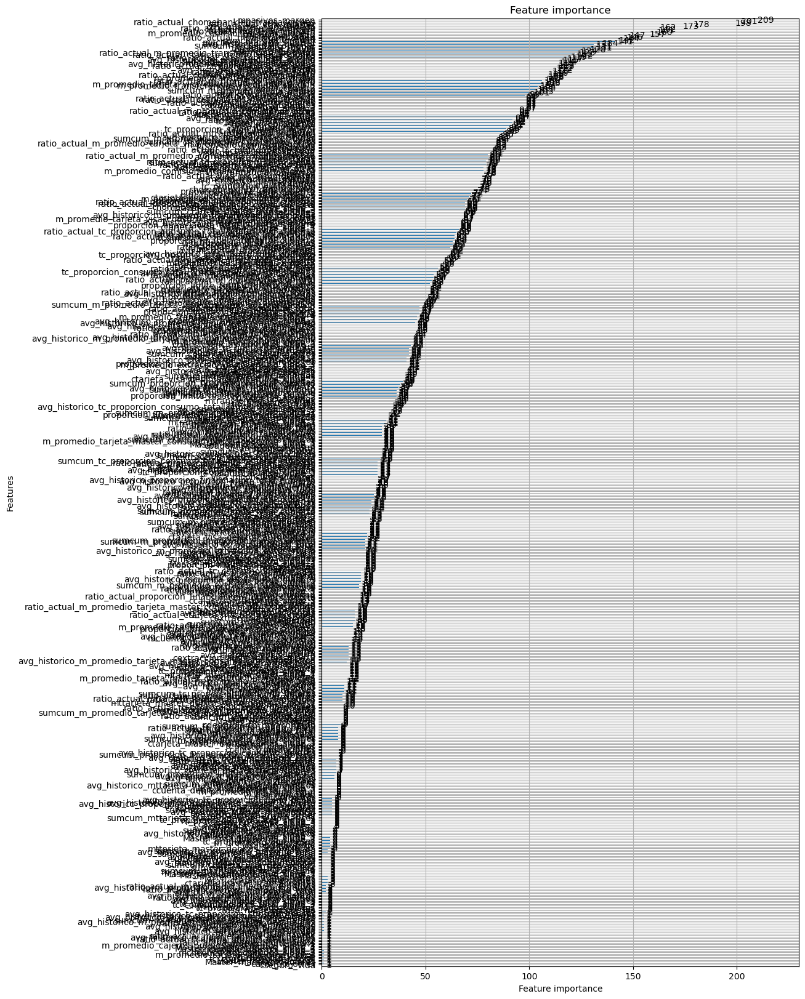

In [20]:
#6. Observamos las variables más importantes para el modelo.
#i. Gráfico.
lgb.plot_importance(model_lgb, figsize=(10, 20))
plt.show()

In [21]:
#ii. Dataframe.
#a. Extract feature importance and feature names.
importance = model_lgb.feature_importance()
features = model_lgb.feature_name()

#b. Create a dataframe for better visualization.
importance_df = pd.DataFrame({'Feature': features, 'Importance': importance})

#c. Sort by importance in descending order.
importance_df = importance_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)

#d. show.
importance_df
#e. Columnas a Eliminar.
cols_eliminar = importance_df[importance_df["Importance"] == 0]["Feature"].to_list()

In [25]:
len(cols_eliminar)

59

In [23]:
importance_df

,Feature,Importance
0,mpasivos_margen,209
1,ratio_actual_chomebanking_transacciones,201
2,ratio_actual_ctrx_quarter,198
3,ctrx_quarter,178
4,ctrx_quarter_normalizado,173
...,...,...
664,avg_historico_minversion2,0
665,sumcum_ccajeros_propios_descuentos,0
666,sumcum_mcajeros_propios_descuentos,0
667,avg_historico_mcajeros_propios_descuentos,0


In [22]:
#7. Guardamos el modelo.
model_lgb.save_model('./lgb_datos_abril_menos_3_sin_prestamos.txt')

In [ ]:
#8. Volvemos a leer el modelo.
model_lgb = lgb.Booster(model_file="./lgb_datos_abril_menos_3_sin_prestamos.txt")

In [26]:
api = KaggleApi()
api.authenticate()

In [27]:
#i. Entrenamos con Abril y predecimos Junio.
#vi. Predecimos Junio.
predicciones = model_lgb.predict(X_test)
#vii. Le pegamos la probabilidad de ser "BAJA" a cada cliente.
X_test['Probabilidad'] = predicciones
#viii. Ordenamos a los clientes por probabilidad de ser "BAJA" de forma descendente.
tb_entrega = X_test.sort_values(by='Probabilidad', ascending=False)
#ix. Genero una lista de distintos cortes candidatos, para enviar a Kaggle.
cortes = range(11000,13000,500)
#x. Generamos las distintas predicciones de clases a partir de los distintos cortes posibles.
num_subida_kaggle = 1
print("--> Comienzan los envíos a Kaggle...\n")
for envios in cortes:
    #1. Le ponemos clase 1 ("BAJA") a los primeros "envios" con mayor probabilidad.
    tb_entrega['Predicted'] = 0
    tb_entrega.iloc[:envios, tb_entrega.columns.get_loc('Predicted')] = 1
    resultados = tb_entrega[["numero_de_cliente", 'Predicted']].reset_index(drop=True)

    print("Cantidad de clientes {}".format(envios))
    #2. Guardamos el archivo para Kaggle.
    nombre_archivo = "K107_EK_3_SPP_LimpCol_0{}.csv".format(num_subida_kaggle) #DF con -X meses, número de intento, número de semilla.
    ruta_archivo= "../../../exp/{}".format(nombre_archivo)
    resultados.to_csv(ruta_archivo, index=False)

    num_subida_kaggle += 1

    #3. Envío a Kaggle.
    #a. Defino los parámetros claves.
    mensaje = f'Archivo {nombre_archivo}. Abril DF sin PP. Corte:{envios}' # Datos de Train, si está con Data Drifting o no, semilla y punto de corte de prueba.
    competencia = 'dm-ey-f-2024-primera'
    #c. Subo la Submission.
    api.competition_submit(file_name=ruta_archivo, message=mensaje, competition=competencia)
    print("Submission Bien!")

--> Comienzan los envíos a Kaggle...

Cantidad de clientes 11000


100%|██████████| 2.08M/2.08M [00:01<00:00, 1.35MB/s]


Submission Bien!
Cantidad de clientes 11500


100%|██████████| 2.08M/2.08M [00:01<00:00, 1.29MB/s]


Submission Bien!
Cantidad de clientes 12000


100%|██████████| 2.08M/2.08M [00:01<00:00, 1.30MB/s]


Submission Bien!
Cantidad de clientes 12500


100%|██████████| 2.08M/2.08M [00:01<00:00, 1.30MB/s]


Submission Bien!


## E. Train con Abril -3 DF, quitando todas las columnas relacionadas a monetarias.

In [ ]:
###################################################################################################################
###################################################################################################################
###################################################################################################################
###################################################################################################################
############################ Quitamos todas las columnas relacionadas con monetarias, ###################
############################ antes de comenzar la optimización de hiperparámetros #################################
###################################################################################################################
###################################################################################################################
###################################################################################################################
###################################################################################################################
campos_monetarios = [col for col in data.columns if col.startswith(('m', 'Visa_m', 'Master_m', 'vm_m'))]


columnas_de_interes_prestamos = data.filter(like='mvisa').columns

data.drop(columnas_de_interes_prestamos,axis=1,inplace=True)

In [ ]:
#1. Funcion de optimización de hiperparámetros.
def objective(trial): 
    # Rango de parámetros a buscar sus valores óptimos.
    num_leaves = trial.suggest_int('num_leaves', 10, 200)
    learning_rate = trial.suggest_float('learning_rate', 0.005, 0.3) # mas bajo, más iteraciones necesita.
    min_data_in_leaf = trial.suggest_int('min_data_in_leaf', 50, 2000)
    feature_fraction = trial.suggest_float('feature_fraction', 0.1, 1.0)
    bagging_fraction = trial.suggest_float('bagging_fraction', 0.1, 1.0)


    # Parámetros que le voy a pasar al modelo.
    params = {
        'objective': 'binary',
        'metric': 'custom',
        'boosting_type': 'gbdt',
        'first_metric_only': True,
        'boost_from_average': True,
        'feature_pre_filter': False,
        'max_bin': 31,
        'num_leaves': num_leaves,
        'learning_rate': learning_rate,
        'min_data_in_leaf': min_data_in_leaf,
        'feature_fraction': feature_fraction,
        'bagging_fraction': bagging_fraction,
        'seed': semillas[0],
        'verbose': -1
    }
    
    # Creo el dataset para Light GBM.
    train_data = lgb.Dataset(X_train,
                              label=y_train_binaria2, # eligir la clase
                              weight=w_train)
    
    # Entreno.
    cv_results = lgb.cv(
        params,
        train_data,
        num_boost_round=1000, # modificar, subit y subir... y descomentar la línea inferior
        callbacks=[lgb.early_stopping(int(50 + 5 / learning_rate))],
        feval=lgb_gan_eval,
        stratified=True,
        nfold=5,
        seed=semillas[0]
    )
    
    # Calculo la ganancia máxima y la mejor iteración donde se obtuvo dicha ganancia.
    max_gan = max(cv_results['valid gan_eval-mean'])
    best_iter = cv_results['valid gan_eval-mean'].index(max_gan) + 1

    # Guardamos cual es la mejor iteración del modelo
    trial.set_user_attr("best_iter", best_iter)

    return max_gan * 5

In [ ]:
# Elimino de mi Dataframe las columnas con importancia 0 (está definida la variable más adelante, después de un entrenamiento).
#i. Leo el modelo anterior.
model_lgb = lgb.Booster(model_file="./lgb_datos_abril_menos_3_sin_prestamos.txt")
#ii. Calculo la feature importance.
#a. Extract feature importance and feature names.
importance = model_lgb.feature_importance()
features = model_lgb.feature_name()
#b. Create a dataframe for better visualization.
importance_df = pd.DataFrame({'Feature': features, 'Importance': importance})
#c. Sort by importance in descending order.
importance_df = importance_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)
#d. show.
importance_df
#iii. Defino y elimino las columnas de interés.
cols_eliminar = importance_df[importance_df["Importance"] == 0]["Feature"].to_list()
cols_eliminar.remove("foto_mes")
data = data.drop(columns=cols_eliminar)

In [ ]:
#2. Divido entre Train y Test.
train_data = data[data['foto_mes'] == mes_train_a]
test_data = data[data['foto_mes'] == mes_test]

X_train = train_data.drop(['clase_ternaria', 'clase_peso', 'clase_binaria1','clase_binaria2'], axis=1)
y_train_binaria1 = train_data['clase_binaria1']
y_train_binaria2 = train_data['clase_binaria2']
w_train = train_data['clase_peso']

X_test = test_data.drop(['clase_ternaria', 'clase_peso', 'clase_binaria1','clase_binaria2'], axis=1)
y_test_binaria1 = test_data['clase_binaria1']
y_test_class = test_data['clase_ternaria']
w_test = test_data['clase_peso']

In [ ]:
del data

In [ ]:
#3. Voy a realizar un estudio de Optuna para encontrar los mejores parámetros.
#i. Creo la base de datos donde guardar los resultados.
storage_name = "sqlite:///" + db_path + "optimization_lgbm.db"
study_name = "exp_732_lgbm_train_abril_menos_3_sin_prestamo_limpieza_columnas" # Primer dígito número de clase, segundo dígito df - cuanto, tercer dígito número de entrenamiento.

#ii. Creo el estudio.
study = optuna.create_study(
    direction="maximize",
    study_name=study_name,
    storage=storage_name,
    load_if_exists=True,
)

#iii. Corro el estudio.
study.optimize(objective, n_trials=100)

[I 2024-10-09 22:01:42,070] A new study created in RDB with name: exp_732_lgbm_train_abril_menos_3_sin_prestamo_limpieza_columnas


Training until validation scores don't improve for 78 rounds
Early stopping, best iteration is:
[43]	cv_agg's valid gan_eval: 3.0226e+07 + 1.80406e+06


[I 2024-10-09 22:02:53,634] Trial 0 finished with value: 151130000.0 and parameters: {'num_leaves': 143, 'learning_rate': 0.17820657894714123, 'min_data_in_leaf': 1723, 'feature_fraction': 0.7714085205191796, 'bagging_fraction': 0.5843076483291942}. Best is trial 0 with value: 151130000.0.


Training until validation scores don't improve for 143 rounds
Early stopping, best iteration is:
[308]	cv_agg's valid gan_eval: 3.10492e+07 + 1.69242e+06


[I 2024-10-09 22:07:20,512] Trial 1 finished with value: 155246000.0 and parameters: {'num_leaves': 118, 'learning_rate': 0.05345689556046568, 'min_data_in_leaf': 1635, 'feature_fraction': 0.7366094508174833, 'bagging_fraction': 0.6804784979796983}. Best is trial 1 with value: 155246000.0.


Training until validation scores don't improve for 75 rounds
Early stopping, best iteration is:
[102]	cv_agg's valid gan_eval: 2.95638e+07 + 2.3301e+06


[I 2024-10-09 22:09:43,649] Trial 2 finished with value: 147819000.0 and parameters: {'num_leaves': 115, 'learning_rate': 0.1955844119457719, 'min_data_in_leaf': 1002, 'feature_fraction': 0.42631725969139755, 'bagging_fraction': 0.6566104729917646}. Best is trial 1 with value: 155246000.0.


Training until validation scores don't improve for 92 rounds


[I 2024-10-09 22:10:54,030] Trial 3 finished with value: 150045000.0 and parameters: {'num_leaves': 22, 'learning_rate': 0.11759051524931517, 'min_data_in_leaf': 1011, 'feature_fraction': 0.7888836686528764, 'bagging_fraction': 0.9133945852653494}. Best is trial 1 with value: 155246000.0.


Early stopping, best iteration is:
[70]	cv_agg's valid gan_eval: 3.0009e+07 + 1.7497e+06
Training until validation scores don't improve for 86 rounds
Early stopping, best iteration is:
[48]	cv_agg's valid gan_eval: 2.98326e+07 + 1.81363e+06


[I 2024-10-09 22:12:24,931] Trial 4 finished with value: 149163000.0 and parameters: {'num_leaves': 71, 'learning_rate': 0.13703847818687126, 'min_data_in_leaf': 1811, 'feature_fraction': 0.8094542499952757, 'bagging_fraction': 0.6041042975271714}. Best is trial 1 with value: 155246000.0.


Training until validation scores don't improve for 74 rounds
Early stopping, best iteration is:
[139]	cv_agg's valid gan_eval: 2.8945e+07 + 924467


[I 2024-10-09 22:16:02,345] Trial 5 finished with value: 144725000.0 and parameters: {'num_leaves': 146, 'learning_rate': 0.2077017525442383, 'min_data_in_leaf': 201, 'feature_fraction': 0.9255726718389288, 'bagging_fraction': 0.5822640679980902}. Best is trial 1 with value: 155246000.0.


Training until validation scores don't improve for 71 rounds
Early stopping, best iteration is:
[87]	cv_agg's valid gan_eval: 2.95372e+07 + 1.81649e+06


[I 2024-10-09 22:18:23,057] Trial 6 finished with value: 147686000.0 and parameters: {'num_leaves': 143, 'learning_rate': 0.23610823913673168, 'min_data_in_leaf': 1030, 'feature_fraction': 0.5471502457167313, 'bagging_fraction': 0.14026426314566165}. Best is trial 1 with value: 155246000.0.


Training until validation scores don't improve for 538 rounds
Did not meet early stopping. Best iteration is:
[987]	cv_agg's valid gan_eval: 3.08896e+07 + 1.70018e+06


[I 2024-10-09 22:27:27,046] Trial 7 finished with value: 154448000.0 and parameters: {'num_leaves': 139, 'learning_rate': 0.010232322399683871, 'min_data_in_leaf': 1929, 'feature_fraction': 0.6675731077570489, 'bagging_fraction': 0.403523467667825}. Best is trial 1 with value: 155246000.0.


Training until validation scores don't improve for 116 rounds
Early stopping, best iteration is:
[101]	cv_agg's valid gan_eval: 3.04612e+07 + 1.55128e+06


[I 2024-10-09 22:31:02,649] Trial 8 finished with value: 152306000.0 and parameters: {'num_leaves': 196, 'learning_rate': 0.07512236718369474, 'min_data_in_leaf': 703, 'feature_fraction': 0.7970427097348685, 'bagging_fraction': 0.7640134106231445}. Best is trial 1 with value: 155246000.0.


Training until validation scores don't improve for 76 rounds
Early stopping, best iteration is:
[88]	cv_agg's valid gan_eval: 2.96646e+07 + 937304


[I 2024-10-09 22:32:59,766] Trial 9 finished with value: 148323000.0 and parameters: {'num_leaves': 49, 'learning_rate': 0.18808014419678898, 'min_data_in_leaf': 845, 'feature_fraction': 0.4539585703214549, 'bagging_fraction': 0.8662618710543529}. Best is trial 1 with value: 155246000.0.


Training until validation scores don't improve for 630 rounds
Did not meet early stopping. Best iteration is:
[1000]	cv_agg's valid gan_eval: 3.11276e+07 + 1.58016e+06


[I 2024-10-09 22:40:11,994] Trial 10 finished with value: 155638000.0 and parameters: {'num_leaves': 200, 'learning_rate': 0.008611277840863366, 'min_data_in_leaf': 1437, 'feature_fraction': 0.14835470764628134, 'bagging_fraction': 0.3908959253858882}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 636 rounds
Did not meet early stopping. Best iteration is:
[935]	cv_agg's valid gan_eval: 3.06586e+07 + 1.41055e+06


[I 2024-10-09 22:47:34,769] Trial 11 finished with value: 153293000.0 and parameters: {'num_leaves': 196, 'learning_rate': 0.008527643554204762, 'min_data_in_leaf': 1456, 'feature_fraction': 0.16508325393641843, 'bagging_fraction': 0.36458871220498285}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 125 rounds
Early stopping, best iteration is:
[140]	cv_agg's valid gan_eval: 3.01686e+07 + 1.17036e+06


[I 2024-10-09 22:49:14,303] Trial 12 finished with value: 150843000.0 and parameters: {'num_leaves': 90, 'learning_rate': 0.06644384403523365, 'min_data_in_leaf': 1417, 'feature_fraction': 0.11420689015869867, 'bagging_fraction': 0.40280262187507476}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 123 rounds
Early stopping, best iteration is:
[340]	cv_agg's valid gan_eval: 3.09932e+07 + 654470


[I 2024-10-09 22:53:44,247] Trial 13 finished with value: 154966000.0 and parameters: {'num_leaves': 172, 'learning_rate': 0.0678223111849057, 'min_data_in_leaf': 1444, 'feature_fraction': 0.29957535370893973, 'bagging_fraction': 0.23946718698330152}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 67 rounds
Early stopping, best iteration is:
[28]	cv_agg's valid gan_eval: 2.93762e+07 + 2.15047e+06


[I 2024-10-09 22:54:41,981] Trial 14 finished with value: 146881000.0 and parameters: {'num_leaves': 104, 'learning_rate': 0.29343281219371764, 'min_data_in_leaf': 1581, 'feature_fraction': 0.2741970423157718, 'bagging_fraction': 0.754415847316441}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 150 rounds
Early stopping, best iteration is:
[145]	cv_agg's valid gan_eval: 3.07328e+07 + 1.47753e+06


[I 2024-10-09 22:59:02,939] Trial 15 finished with value: 153664000.0 and parameters: {'num_leaves': 168, 'learning_rate': 0.049646408900651126, 'min_data_in_leaf': 1274, 'feature_fraction': 0.9896085594747496, 'bagging_fraction': 0.465134727593299}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 96 rounds
Early stopping, best iteration is:
[206]	cv_agg's valid gan_eval: 3.02708e+07 + 1.29326e+06


[I 2024-10-09 23:00:30,615] Trial 16 finished with value: 151354000.0 and parameters: {'num_leaves': 10, 'learning_rate': 0.10695684468049921, 'min_data_in_leaf': 1209, 'feature_fraction': 0.6306763994186482, 'bagging_fraction': 0.30309325097752293}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 171 rounds
Early stopping, best iteration is:
[151]	cv_agg's valid gan_eval: 3.04612e+07 + 1.19116e+06


[I 2024-10-09 23:04:09,325] Trial 17 finished with value: 152306000.0 and parameters: {'num_leaves': 69, 'learning_rate': 0.04128242410530934, 'min_data_in_leaf': 433, 'feature_fraction': 0.37619874625372784, 'bagging_fraction': 0.7410153340634672}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 99 rounds
Early stopping, best iteration is:
[156]	cv_agg's valid gan_eval: 3.0548e+07 + 1.31738e+06


[I 2024-10-09 23:07:38,794] Trial 18 finished with value: 152740000.0 and parameters: {'num_leaves': 171, 'learning_rate': 0.10103609734157541, 'min_data_in_leaf': 1976, 'feature_fraction': 0.5565743674108461, 'bagging_fraction': 0.4847568344817531}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 233 rounds
Early stopping, best iteration is:
[426]	cv_agg's valid gan_eval: 3.11122e+07 + 1.47268e+06


[I 2024-10-09 23:12:56,851] Trial 19 finished with value: 155561000.0 and parameters: {'num_leaves': 123, 'learning_rate': 0.027279507316365595, 'min_data_in_leaf': 1660, 'feature_fraction': 0.20365757628766357, 'bagging_fraction': 0.11086350942303153}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 239 rounds
Early stopping, best iteration is:
[446]	cv_agg's valid gan_eval: 3.10002e+07 + 1.42759e+06


[I 2024-10-09 23:18:17,850] Trial 20 finished with value: 155001000.0 and parameters: {'num_leaves': 45, 'learning_rate': 0.026379621533087677, 'min_data_in_leaf': 1240, 'feature_fraction': 0.2151976611506251, 'bagging_fraction': 0.10171369290354398}. Best is trial 10 with value: 155638000.0.


Training until validation scores don't improve for 189 rounds
Early stopping, best iteration is:
[305]	cv_agg's valid gan_eval: 3.1339e+07 + 1.42649e+06


[I 2024-10-09 23:21:33,020] Trial 21 finished with value: 156695000.0 and parameters: {'num_leaves': 120, 'learning_rate': 0.03589047789651533, 'min_data_in_leaf': 1666, 'feature_fraction': 0.12254142942660629, 'bagging_fraction': 0.20800897827548248}. Best is trial 21 with value: 156695000.0.


Training until validation scores don't improve for 909 rounds
Did not meet early stopping. Best iteration is:
[972]	cv_agg's valid gan_eval: 3.02064e+07 + 1.03123e+06


[I 2024-10-09 23:27:42,992] Trial 22 finished with value: 151032000.0 and parameters: {'num_leaves': 126, 'learning_rate': 0.005817749888973128, 'min_data_in_leaf': 1795, 'feature_fraction': 0.11120710463087247, 'bagging_fraction': 0.21070121270905418}. Best is trial 21 with value: 156695000.0.


Training until validation scores don't improve for 105 rounds
Early stopping, best iteration is:
[98]	cv_agg's valid gan_eval: 3.0926e+07 + 1.7391e+06


[I 2024-10-09 23:29:40,127] Trial 23 finished with value: 154630000.0 and parameters: {'num_leaves': 93, 'learning_rate': 0.09055294132121325, 'min_data_in_leaf': 1553, 'feature_fraction': 0.22749833590945592, 'bagging_fraction': 0.20400973247495138}. Best is trial 21 with value: 156695000.0.


Training until validation scores don't improve for 182 rounds
Early stopping, best iteration is:
[353]	cv_agg's valid gan_eval: 3.07314e+07 + 1.15716e+06


[I 2024-10-09 23:34:44,670] Trial 24 finished with value: 153657000.0 and parameters: {'num_leaves': 159, 'learning_rate': 0.037636136419433946, 'min_data_in_leaf': 1323, 'feature_fraction': 0.3185026838499809, 'bagging_fraction': 0.30405093477601597}. Best is trial 21 with value: 156695000.0.


Training until validation scores don't improve for 84 rounds
Early stopping, best iteration is:
[136]	cv_agg's valid gan_eval: 3.01224e+07 + 1.13355e+06


[I 2024-10-09 23:36:32,119] Trial 25 finished with value: 150612000.0 and parameters: {'num_leaves': 181, 'learning_rate': 0.14419322384396252, 'min_data_in_leaf': 1691, 'feature_fraction': 0.1809898518522956, 'bagging_fraction': 0.15753693018049597}. Best is trial 21 with value: 156695000.0.


Training until validation scores don't improve for 237 rounds
Early stopping, best iteration is:
[346]	cv_agg's valid gan_eval: 3.09834e+07 + 1.65382e+06


[I 2024-10-09 23:42:28,168] Trial 26 finished with value: 154917000.0 and parameters: {'num_leaves': 128, 'learning_rate': 0.026618120662199964, 'min_data_in_leaf': 1792, 'feature_fraction': 0.3481575051852446, 'bagging_fraction': 0.2845107514790123}. Best is trial 21 with value: 156695000.0.


Training until validation scores don't improve for 108 rounds
Early stopping, best iteration is:
[177]	cv_agg's valid gan_eval: 3.07132e+07 + 973243


[I 2024-10-09 23:44:20,979] Trial 27 finished with value: 153566000.0 and parameters: {'num_leaves': 76, 'learning_rate': 0.08576287067507994, 'min_data_in_leaf': 1134, 'feature_fraction': 0.10621986793542981, 'bagging_fraction': 0.3516895452871206}. Best is trial 21 with value: 156695000.0.


Training until validation scores don't improve for 237 rounds
Early stopping, best iteration is:
[399]	cv_agg's valid gan_eval: 3.16232e+07 + 1.68554e+06


[I 2024-10-09 23:50:02,959] Trial 28 finished with value: 158116000.0 and parameters: {'num_leaves': 106, 'learning_rate': 0.026692847169189456, 'min_data_in_leaf': 1521, 'feature_fraction': 0.2504732412737233, 'bagging_fraction': 0.4929617621811486}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 81 rounds
Early stopping, best iteration is:
[46]	cv_agg's valid gan_eval: 3.0051e+07 + 1.65486e+06


[I 2024-10-09 23:51:17,367] Trial 29 finished with value: 150255000.0 and parameters: {'num_leaves': 105, 'learning_rate': 0.16016261067781665, 'min_data_in_leaf': 1523, 'feature_fraction': 0.24173566160417914, 'bagging_fraction': 0.5000957570039125}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 89 rounds
Early stopping, best iteration is:
[57]	cv_agg's valid gan_eval: 2.99278e+07 + 1.0201e+06


[I 2024-10-09 23:52:33,562] Trial 30 finished with value: 149639000.0 and parameters: {'num_leaves': 155, 'learning_rate': 0.12790467362895452, 'min_data_in_leaf': 812, 'feature_fraction': 0.1562882668500479, 'bagging_fraction': 0.5384726171007898}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 218 rounds
Early stopping, best iteration is:
[459]	cv_agg's valid gan_eval: 3.1374e+07 + 1.07735e+06


[I 2024-10-09 23:57:47,190] Trial 31 finished with value: 156870000.0 and parameters: {'num_leaves': 86, 'learning_rate': 0.029720785140729313, 'min_data_in_leaf': 1666, 'feature_fraction': 0.19522433428671504, 'bagging_fraction': 0.10288811533904631}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 137 rounds
Early stopping, best iteration is:
[159]	cv_agg's valid gan_eval: 3.11486e+07 + 1.53689e+06


[I 2024-10-10 00:00:32,030] Trial 32 finished with value: 155743000.0 and parameters: {'num_leaves': 53, 'learning_rate': 0.05685919632818509, 'min_data_in_leaf': 1885, 'feature_fraction': 0.26672875020340675, 'bagging_fraction': 0.24752708414148383}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 137 rounds
Early stopping, best iteration is:
[259]	cv_agg's valid gan_eval: 3.08714e+07 + 1.28643e+06


[I 2024-10-10 00:03:45,002] Trial 33 finished with value: 154357000.0 and parameters: {'num_leaves': 49, 'learning_rate': 0.05703692726217882, 'min_data_in_leaf': 1872, 'feature_fraction': 0.2612185760547317, 'bagging_fraction': 0.17698494902583722}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 168 rounds
Early stopping, best iteration is:
[351]	cv_agg's valid gan_eval: 3.14048e+07 + 1.44348e+06


[I 2024-10-10 00:09:29,809] Trial 34 finished with value: 157024000.0 and parameters: {'num_leaves': 85, 'learning_rate': 0.042275968550200785, 'min_data_in_leaf': 1682, 'feature_fraction': 0.39963581129327075, 'bagging_fraction': 0.23907882193554889}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 188 rounds
Early stopping, best iteration is:
[324]	cv_agg's valid gan_eval: 3.10212e+07 + 1.81142e+06


[I 2024-10-10 00:15:08,967] Trial 35 finished with value: 155106000.0 and parameters: {'num_leaves': 88, 'learning_rate': 0.036163192884276996, 'min_data_in_leaf': 1707, 'feature_fraction': 0.4522039182196691, 'bagging_fraction': 0.2482410968925884}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 109 rounds
Early stopping, best iteration is:
[89]	cv_agg's valid gan_eval: 3.0926e+07 + 1.53266e+06


[I 2024-10-10 00:17:25,831] Trial 36 finished with value: 154630000.0 and parameters: {'num_leaves': 111, 'learning_rate': 0.08380896915125606, 'min_data_in_leaf': 1635, 'feature_fraction': 0.3853856611212984, 'bagging_fraction': 0.17246731011974142}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 148 rounds
Early stopping, best iteration is:
[396]	cv_agg's valid gan_eval: 3.12158e+07 + 1.08131e+06


[I 2024-10-10 00:22:42,675] Trial 37 finished with value: 156079000.0 and parameters: {'num_leaves': 81, 'learning_rate': 0.05054866184219629, 'min_data_in_leaf': 1819, 'feature_fraction': 0.31972735957348736, 'bagging_fraction': 0.6652058901852851}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 72 rounds
Early stopping, best iteration is:
[63]	cv_agg's valid gan_eval: 2.92502e+07 + 2.01888e+06


[I 2024-10-10 00:24:34,582] Trial 38 finished with value: 146251000.0 and parameters: {'num_leaves': 98, 'learning_rate': 0.22675861782775747, 'min_data_in_leaf': 1344, 'feature_fraction': 0.4973523540577669, 'bagging_fraction': 0.33836882030529974}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 292 rounds
Early stopping, best iteration is:
[354]	cv_agg's valid gan_eval: 3.0772e+07 + 1.82599e+06


[I 2024-10-10 00:31:08,744] Trial 39 finished with value: 153860000.0 and parameters: {'num_leaves': 114, 'learning_rate': 0.020601596385267464, 'min_data_in_leaf': 107, 'feature_fraction': 0.40253849657123153, 'bagging_fraction': 0.45118842701934375}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 80 rounds
Early stopping, best iteration is:
[108]	cv_agg's valid gan_eval: 3.00062e+07 + 1.6986e+06


[I 2024-10-10 00:33:12,131] Trial 40 finished with value: 150031000.0 and parameters: {'num_leaves': 63, 'learning_rate': 0.16573222403546892, 'min_data_in_leaf': 1133, 'feature_fraction': 0.3488962252018254, 'bagging_fraction': 0.13445145018787147}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 159 rounds
Early stopping, best iteration is:
[201]	cv_agg's valid gan_eval: 3.13068e+07 + 1.39944e+06


[I 2024-10-10 00:36:44,723] Trial 41 finished with value: 156534000.0 and parameters: {'num_leaves': 79, 'learning_rate': 0.0456033938388197, 'min_data_in_leaf': 1787, 'feature_fraction': 0.3078682879626793, 'bagging_fraction': 0.6441650897767136}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 123 rounds
Early stopping, best iteration is:
[229]	cv_agg's valid gan_eval: 3.08392e+07 + 2.14046e+06


[I 2024-10-10 00:39:28,554] Trial 42 finished with value: 154196000.0 and parameters: {'num_leaves': 82, 'learning_rate': 0.06770108582466135, 'min_data_in_leaf': 1732, 'feature_fraction': 0.18482956370497614, 'bagging_fraction': 0.6104450010975848}. Best is trial 28 with value: 158116000.0.


Training until validation scores don't improve for 182 rounds
Early stopping, best iteration is:
[452]	cv_agg's valid gan_eval: 3.16666e+07 + 1.55285e+06


[I 2024-10-10 00:44:28,399] Trial 43 finished with value: 158333000.0 and parameters: {'num_leaves': 64, 'learning_rate': 0.03771912632246778, 'min_data_in_leaf': 2000, 'feature_fraction': 0.3011833204885418, 'bagging_fraction': 0.8359847980928077}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 285 rounds
Did not meet early stopping. Best iteration is:
[874]	cv_agg's valid gan_eval: 3.09722e+07 + 1.28031e+06


[I 2024-10-10 00:56:37,177] Trial 44 finished with value: 154861000.0 and parameters: {'num_leaves': 138, 'learning_rate': 0.021213667733819098, 'min_data_in_leaf': 1993, 'feature_fraction': 0.5045893849248153, 'bagging_fraction': 0.8960288494820632}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 193 rounds
Early stopping, best iteration is:
[355]	cv_agg's valid gan_eval: 3.10436e+07 + 1.45411e+06


[I 2024-10-10 01:00:26,118] Trial 45 finished with value: 155218000.0 and parameters: {'num_leaves': 64, 'learning_rate': 0.034929044855414475, 'min_data_in_leaf': 1577, 'feature_fraction': 0.1474029062869943, 'bagging_fraction': 0.8407535948004665}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 67 rounds


[I 2024-10-10 01:01:48,008] Trial 46 finished with value: 145117000.0 and parameters: {'num_leaves': 40, 'learning_rate': 0.2937997582554153, 'min_data_in_leaf': 1892, 'feature_fraction': 0.8632842071243533, 'bagging_fraction': 0.7072371655287935}. Best is trial 43 with value: 158333000.0.


Early stopping, best iteration is:
[68]	cv_agg's valid gan_eval: 2.90234e+07 + 1.69018e+06
Training until validation scores don't improve for 113 rounds
Early stopping, best iteration is:
[246]	cv_agg's valid gan_eval: 3.06348e+07 + 1.82964e+06


[I 2024-10-10 01:04:43,190] Trial 47 finished with value: 153174000.0 and parameters: {'num_leaves': 34, 'learning_rate': 0.07843457598625594, 'min_data_in_leaf': 1627, 'feature_fraction': 0.23561729930880687, 'bagging_fraction': 0.9572264610272112}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 68 rounds
Early stopping, best iteration is:
[91]	cv_agg's valid gan_eval: 2.88708e+07 + 769944


[I 2024-10-10 01:06:41,577] Trial 48 finished with value: 144354000.0 and parameters: {'num_leaves': 100, 'learning_rate': 0.27549716152338827, 'min_data_in_leaf': 1480, 'feature_fraction': 0.4241150957838339, 'bagging_fraction': 0.9944788460290696}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 128 rounds
Early stopping, best iteration is:
[142]	cv_agg's valid gan_eval: 3.04724e+07 + 1.72593e+06


[I 2024-10-10 01:09:09,033] Trial 49 finished with value: 152362000.0 and parameters: {'num_leaves': 112, 'learning_rate': 0.06353983552411183, 'min_data_in_leaf': 1388, 'feature_fraction': 0.28259311039259305, 'bagging_fraction': 0.211587700367412}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 94 rounds
Early stopping, best iteration is:
[149]	cv_agg's valid gan_eval: 3.06082e+07 + 1.48145e+06


[I 2024-10-10 01:10:53,042] Trial 50 finished with value: 153041000.0 and parameters: {'num_leaves': 89, 'learning_rate': 0.11165346924194781, 'min_data_in_leaf': 1939, 'feature_fraction': 0.14213401030305944, 'bagging_fraction': 0.8088503882301068}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 155 rounds
Early stopping, best iteration is:
[244]	cv_agg's valid gan_eval: 3.07762e+07 + 1.22645e+06


[I 2024-10-10 01:15:12,054] Trial 51 finished with value: 153881000.0 and parameters: {'num_leaves': 72, 'learning_rate': 0.047261687495906375, 'min_data_in_leaf': 1777, 'feature_fraction': 0.3444104758314618, 'bagging_fraction': 0.6189784853963629}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 342 rounds
Early stopping, best iteration is:
[617]	cv_agg's valid gan_eval: 3.1353e+07 + 1.44999e+06


[I 2024-10-10 01:24:08,724] Trial 52 finished with value: 156765000.0 and parameters: {'num_leaves': 58, 'learning_rate': 0.017117525020894357, 'min_data_in_leaf': 1713, 'feature_fraction': 0.2972533931244301, 'bagging_fraction': 0.544402539354142}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 348 rounds
Did not meet early stopping. Best iteration is:
[948]	cv_agg's valid gan_eval: 3.087e+07 + 1.16756e+06


[I 2024-10-10 01:33:16,070] Trial 53 finished with value: 154350000.0 and parameters: {'num_leaves': 55, 'learning_rate': 0.01676287225921066, 'min_data_in_leaf': 1527, 'feature_fraction': 0.7103266681575292, 'bagging_fraction': 0.5179756903082986}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 470 rounds
Did not meet early stopping. Best iteration is:
[738]	cv_agg's valid gan_eval: 3.0779e+07 + 1.09827e+06


[I 2024-10-10 01:41:11,578] Trial 54 finished with value: 153895000.0 and parameters: {'num_leaves': 60, 'learning_rate': 0.011903085880274342, 'min_data_in_leaf': 527, 'feature_fraction': 0.21837466134101427, 'bagging_fraction': 0.4243071131125189}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 206 rounds
Early stopping, best iteration is:
[407]	cv_agg's valid gan_eval: 3.14874e+07 + 1.59512e+06


[I 2024-10-10 01:45:51,268] Trial 55 finished with value: 157437000.0 and parameters: {'num_leaves': 96, 'learning_rate': 0.031982964080493365, 'min_data_in_leaf': 1619, 'feature_fraction': 0.18306744586243995, 'bagging_fraction': 0.5780375185019957}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 102 rounds
Early stopping, best iteration is:
[190]	cv_agg's valid gan_eval: 3.03702e+07 + 1.70704e+06


[I 2024-10-10 01:48:12,477] Trial 56 finished with value: 151851000.0 and parameters: {'num_leaves': 96, 'learning_rate': 0.09610202157652073, 'min_data_in_leaf': 1872, 'feature_fraction': 0.18979882151154076, 'bagging_fraction': 0.5723740480366449}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 878 rounds
Did not meet early stopping. Best iteration is:
[913]	cv_agg's valid gan_eval: 3.03828e+07 + 1.36517e+06


[I 2024-10-10 01:56:13,687] Trial 57 finished with value: 151914000.0 and parameters: {'num_leaves': 27, 'learning_rate': 0.0060331712891306, 'min_data_in_leaf': 1509, 'feature_fraction': 0.2587159611843418, 'bagging_fraction': 0.699593567768219}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 209 rounds
Early stopping, best iteration is:
[359]	cv_agg's valid gan_eval: 3.0961e+07 + 1.3142e+06


[I 2024-10-10 02:01:39,807] Trial 58 finished with value: 154805000.0 and parameters: {'num_leaves': 70, 'learning_rate': 0.031354751545369305, 'min_data_in_leaf': 1599, 'feature_fraction': 0.2921599837502774, 'bagging_fraction': 0.5733251265985119}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 118 rounds
Early stopping, best iteration is:
[104]	cv_agg's valid gan_eval: 3.0625e+07 + 920962


[I 2024-10-10 02:03:50,170] Trial 59 finished with value: 153125000.0 and parameters: {'num_leaves': 106, 'learning_rate': 0.07316215009271923, 'min_data_in_leaf': 1726, 'feature_fraction': 0.6010908982131555, 'bagging_fraction': 0.7985259279074792}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 131 rounds
Early stopping, best iteration is:
[141]	cv_agg's valid gan_eval: 3.12144e+07 + 1.06347e+06


[I 2024-10-10 02:06:53,045] Trial 60 finished with value: 156072000.0 and parameters: {'num_leaves': 84, 'learning_rate': 0.06099581698657784, 'min_data_in_leaf': 1394, 'feature_fraction': 0.3501827792967999, 'bagging_fraction': 0.4358113221064241}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 167 rounds
Early stopping, best iteration is:
[281]	cv_agg's valid gan_eval: 3.04542e+07 + 1.35367e+06


[I 2024-10-10 02:10:04,039] Trial 61 finished with value: 152271000.0 and parameters: {'num_leaves': 120, 'learning_rate': 0.04251726970613362, 'min_data_in_leaf': 1668, 'feature_fraction': 0.14043946074996538, 'bagging_fraction': 0.10312339633964705}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 343 rounds
Early stopping, best iteration is:
[528]	cv_agg's valid gan_eval: 3.09624e+07 + 1.65924e+06


[I 2024-10-10 02:16:48,185] Trial 62 finished with value: 154812000.0 and parameters: {'num_leaves': 137, 'learning_rate': 0.017007258177562434, 'min_data_in_leaf': 1834, 'feature_fraction': 0.20574780367216391, 'bagging_fraction': 0.2789351784578561}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 213 rounds
Early stopping, best iteration is:
[361]	cv_agg's valid gan_eval: 3.11864e+07 + 1.28806e+06


[I 2024-10-10 02:21:37,694] Trial 63 finished with value: 155932000.0 and parameters: {'num_leaves': 130, 'learning_rate': 0.03065190982626029, 'min_data_in_leaf': 1730, 'feature_fraction': 0.23567295185216672, 'bagging_fraction': 0.37785361095179704}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 263 rounds
Early stopping, best iteration is:
[586]	cv_agg's valid gan_eval: 3.1465e+07 + 1.58884e+06


[I 2024-10-10 02:27:39,836] Trial 64 finished with value: 157325000.0 and parameters: {'num_leaves': 74, 'learning_rate': 0.0233732609718795, 'min_data_in_leaf': 1954, 'feature_fraction': 0.17216370368416364, 'bagging_fraction': 0.1431777886493806}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 258 rounds
Early stopping, best iteration is:
[437]	cv_agg's valid gan_eval: 3.13824e+07 + 1.79444e+06


[I 2024-10-10 02:32:49,378] Trial 65 finished with value: 156912000.0 and parameters: {'num_leaves': 75, 'learning_rate': 0.02393905187540296, 'min_data_in_leaf': 1943, 'feature_fraction': 0.1875450303345372, 'bagging_fraction': 0.536758184600688}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 141 rounds
Early stopping, best iteration is:
[273]	cv_agg's valid gan_eval: 3.04864e+07 + 2.07776e+06


[I 2024-10-10 02:35:06,843] Trial 66 finished with value: 152432000.0 and parameters: {'num_leaves': 73, 'learning_rate': 0.05462198962902748, 'min_data_in_leaf': 1944, 'feature_fraction': 0.1001261109800873, 'bagging_fraction': 0.1472062935926384}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 239 rounds
Early stopping, best iteration is:
[514]	cv_agg's valid gan_eval: 3.09666e+07 + 1.4709e+06


[I 2024-10-10 02:40:40,160] Trial 67 finished with value: 154833000.0 and parameters: {'num_leaves': 86, 'learning_rate': 0.026423752479079087, 'min_data_in_leaf': 1912, 'feature_fraction': 0.18217439965921314, 'bagging_fraction': 0.11804966723383302}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 172 rounds
Early stopping, best iteration is:
[232]	cv_agg's valid gan_eval: 3.09358e+07 + 1.23646e+06


[I 2024-10-10 02:43:34,520] Trial 68 finished with value: 154679000.0 and parameters: {'num_leaves': 68, 'learning_rate': 0.04071312810121358, 'min_data_in_leaf': 1983, 'feature_fraction': 0.1621384252054392, 'bagging_fraction': 0.32678324087174554}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 927 rounds
Did not meet early stopping. Best iteration is:
[959]	cv_agg's valid gan_eval: 3.0569e+07 + 1.63677e+06


[I 2024-10-10 02:51:55,722] Trial 69 finished with value: 152845000.0 and parameters: {'num_leaves': 93, 'learning_rate': 0.005695465431887477, 'min_data_in_leaf': 1840, 'feature_fraction': 0.24810081504052214, 'bagging_fraction': 0.1888755064587388}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 152 rounds
Early stopping, best iteration is:
[133]	cv_agg's valid gan_eval: 3.11556e+07 + 1.66505e+06


[I 2024-10-10 02:54:15,999] Trial 70 finished with value: 155778000.0 and parameters: {'num_leaves': 103, 'learning_rate': 0.048884988561271804, 'min_data_in_leaf': 1781, 'feature_fraction': 0.20921588995035326, 'bagging_fraction': 0.5109039372847358}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 294 rounds
Early stopping, best iteration is:
[455]	cv_agg's valid gan_eval: 3.13544e+07 + 1.24374e+06


[I 2024-10-10 03:00:22,252] Trial 71 finished with value: 156772000.0 and parameters: {'num_leaves': 77, 'learning_rate': 0.02046339460671845, 'min_data_in_leaf': 1999, 'feature_fraction': 0.2796713719081751, 'bagging_fraction': 0.4767407726111375}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 278 rounds
Early stopping, best iteration is:
[607]	cv_agg's valid gan_eval: 3.10422e+07 + 1.39455e+06


[I 2024-10-10 03:08:43,134] Trial 72 finished with value: 155211000.0 and parameters: {'num_leaves': 75, 'learning_rate': 0.02186813900299276, 'min_data_in_leaf': 1956, 'feature_fraction': 0.31857349339792457, 'bagging_fraction': 0.4803060733187966}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 196 rounds
Early stopping, best iteration is:
[352]	cv_agg's valid gan_eval: 3.1409e+07 + 1.18264e+06


[I 2024-10-10 03:12:56,347] Trial 73 finished with value: 157045000.0 and parameters: {'num_leaves': 79, 'learning_rate': 0.03417021137577364, 'min_data_in_leaf': 1898, 'feature_fraction': 0.19889157681477393, 'bagging_fraction': 0.4152934100773449}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 202 rounds
Early stopping, best iteration is:
[251]	cv_agg's valid gan_eval: 3.11626e+07 + 1.78161e+06


[I 2024-10-10 03:16:02,112] Trial 74 finished with value: 155813000.0 and parameters: {'num_leaves': 91, 'learning_rate': 0.03277336286887188, 'min_data_in_leaf': 1921, 'feature_fraction': 0.13296933869180377, 'bagging_fraction': 0.4019967420022844}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 163 rounds
Early stopping, best iteration is:
[343]	cv_agg's valid gan_eval: 3.1465e+07 + 1.7263e+06


[I 2024-10-10 03:19:26,457] Trial 75 finished with value: 157325000.0 and parameters: {'num_leaves': 65, 'learning_rate': 0.04401307704215554, 'min_data_in_leaf': 1846, 'feature_fraction': 0.17218466895844317, 'bagging_fraction': 0.1357244000540418}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 167 rounds
Early stopping, best iteration is:
[209]	cv_agg's valid gan_eval: 3.11346e+07 + 1.18728e+06


[I 2024-10-10 03:22:15,554] Trial 76 finished with value: 155673000.0 and parameters: {'num_leaves': 65, 'learning_rate': 0.04246501313678215, 'min_data_in_leaf': 1882, 'feature_fraction': 0.1721293518945979, 'bagging_fraction': 0.26106103115305884}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 120 rounds
Early stopping, best iteration is:
[169]	cv_agg's valid gan_eval: 3.03464e+07 + 1.46956e+06


[I 2024-10-10 03:24:40,603] Trial 77 finished with value: 151732000.0 and parameters: {'num_leaves': 46, 'learning_rate': 0.07093837642809116, 'min_data_in_leaf': 1844, 'feature_fraction': 0.23257595731399033, 'bagging_fraction': 0.22877887387728893}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 140 rounds
Early stopping, best iteration is:
[184]	cv_agg's valid gan_eval: 3.09512e+07 + 1.03172e+06


[I 2024-10-10 03:27:03,176] Trial 78 finished with value: 154756000.0 and parameters: {'num_leaves': 81, 'learning_rate': 0.055360435378339706, 'min_data_in_leaf': 1755, 'feature_fraction': 0.16326064641514856, 'bagging_fraction': 0.5907134802933156}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 76 rounds
Early stopping, best iteration is:
[73]	cv_agg's valid gan_eval: 2.94644e+07 + 1.98547e+06


[I 2024-10-10 03:28:04,384] Trial 79 finished with value: 147322000.0 and parameters: {'num_leaves': 67, 'learning_rate': 0.1856333354760275, 'min_data_in_leaf': 873, 'feature_fraction': 0.12535040762325914, 'bagging_fraction': 0.4529608640835739}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 180 rounds
Early stopping, best iteration is:
[381]	cv_agg's valid gan_eval: 3.12662e+07 + 1.20365e+06


[I 2024-10-10 03:32:28,652] Trial 80 finished with value: 156331000.0 and parameters: {'num_leaves': 53, 'learning_rate': 0.03836273679916137, 'min_data_in_leaf': 1930, 'feature_fraction': 0.21598775603215756, 'bagging_fraction': 0.5316462513755373}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 437 rounds
Did not meet early stopping. Best iteration is:
[565]	cv_agg's valid gan_eval: 3.10576e+07 + 1.61135e+06


[I 2024-10-10 03:39:58,586] Trial 81 finished with value: 155288000.0 and parameters: {'num_leaves': 87, 'learning_rate': 0.012890340852659322, 'min_data_in_leaf': 1667, 'feature_fraction': 0.1914924230813837, 'bagging_fraction': 0.15582702762038247}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 215 rounds
Early stopping, best iteration is:
[456]	cv_agg's valid gan_eval: 3.11878e+07 + 1.10498e+06


[I 2024-10-10 03:45:15,856] Trial 82 finished with value: 155939000.0 and parameters: {'num_leaves': 97, 'learning_rate': 0.030147174865361313, 'min_data_in_leaf': 1835, 'feature_fraction': 0.2544757195899735, 'bagging_fraction': 0.1169655739306793}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 235 rounds
Early stopping, best iteration is:
[416]	cv_agg's valid gan_eval: 3.12368e+07 + 1.25627e+06


[I 2024-10-10 03:50:12,000] Trial 83 finished with value: 156184000.0 and parameters: {'num_leaves': 78, 'learning_rate': 0.026893264770725938, 'min_data_in_leaf': 1998, 'feature_fraction': 0.19929849667478075, 'bagging_fraction': 0.17811803105782725}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 146 rounds
Early stopping, best iteration is:
[226]	cv_agg's valid gan_eval: 3.10352e+07 + 1.6888e+06


[I 2024-10-10 03:52:54,499] Trial 84 finished with value: 155176000.0 and parameters: {'num_leaves': 109, 'learning_rate': 0.05167361856955599, 'min_data_in_leaf': 1782, 'feature_fraction': 0.16414830844080902, 'bagging_fraction': 0.12965036021194776}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 181 rounds
Early stopping, best iteration is:
[429]	cv_agg's valid gan_eval: 3.11612e+07 + 1.5226e+06


[I 2024-10-10 03:58:24,040] Trial 85 finished with value: 155806000.0 and parameters: {'num_leaves': 59, 'learning_rate': 0.038006837443382686, 'min_data_in_leaf': 1598, 'feature_fraction': 0.27465575174364254, 'bagging_fraction': 0.15860804085026933}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 467 rounds
Did not meet early stopping. Best iteration is:
[728]	cv_agg's valid gan_eval: 3.1164e+07 + 1.28536e+06


[I 2024-10-10 04:09:13,144] Trial 86 finished with value: 155820000.0 and parameters: {'num_leaves': 93, 'learning_rate': 0.011986959710751185, 'min_data_in_leaf': 1623, 'feature_fraction': 0.3689616862923241, 'bagging_fraction': 0.6381288234890949}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 129 rounds
Early stopping, best iteration is:
[160]	cv_agg's valid gan_eval: 3.09232e+07 + 1.54403e+06


[I 2024-10-10 04:11:44,584] Trial 87 finished with value: 154616000.0 and parameters: {'num_leaves': 83, 'learning_rate': 0.06287393208552569, 'min_data_in_leaf': 1464, 'feature_fraction': 0.22915621236114062, 'bagging_fraction': 0.19510369006381215}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 74 rounds
Early stopping, best iteration is:
[54]	cv_agg's valid gan_eval: 2.90486e+07 + 1.43889e+06


[I 2024-10-10 04:12:42,288] Trial 88 finished with value: 145243000.0 and parameters: {'num_leaves': 71, 'learning_rate': 0.20401037293112237, 'min_data_in_leaf': 1858, 'feature_fraction': 0.12281026617323658, 'bagging_fraction': 0.5564339071950767}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 155 rounds
Early stopping, best iteration is:
[214]	cv_agg's valid gan_eval: 3.12242e+07 + 1.59919e+06


[I 2024-10-10 04:15:29,558] Trial 89 finished with value: 156121000.0 and parameters: {'num_leaves': 99, 'learning_rate': 0.04749230125358121, 'min_data_in_leaf': 1903, 'feature_fraction': 0.18096473614878478, 'bagging_fraction': 0.31764866631732463}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 89 rounds
Early stopping, best iteration is:
[160]	cv_agg's valid gan_eval: 3.0835e+07 + 2.02664e+06


[I 2024-10-10 04:17:18,456] Trial 90 finished with value: 154175000.0 and parameters: {'num_leaves': 62, 'learning_rate': 0.12798497543279744, 'min_data_in_leaf': 1697, 'feature_fraction': 0.147258821001232, 'bagging_fraction': 0.35841009710590505}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 305 rounds
Early stopping, best iteration is:
[515]	cv_agg's valid gan_eval: 3.13012e+07 + 1.37827e+06


[I 2024-10-10 04:24:33,443] Trial 91 finished with value: 156506000.0 and parameters: {'num_leaves': 76, 'learning_rate': 0.019537933374686994, 'min_data_in_leaf': 1999, 'feature_fraction': 0.2828757799264191, 'bagging_fraction': 0.22080160383993075}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 266 rounds
Early stopping, best iteration is:
[567]	cv_agg's valid gan_eval: 3.0814e+07 + 1.42086e+06


[I 2024-10-10 04:31:40,119] Trial 92 finished with value: 154070000.0 and parameters: {'num_leaves': 77, 'learning_rate': 0.023047207341472087, 'min_data_in_leaf': 1955, 'feature_fraction': 0.26192618745047963, 'bagging_fraction': 0.496482684529574}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 221 rounds
Early stopping, best iteration is:
[486]	cv_agg's valid gan_eval: 3.1234e+07 + 1.05614e+06


[I 2024-10-10 04:38:38,703] Trial 93 finished with value: 156170000.0 and parameters: {'num_leaves': 86, 'learning_rate': 0.029199781028993184, 'min_data_in_leaf': 1808, 'feature_fraction': 0.33413538707214685, 'bagging_fraction': 0.4686222786211697}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 381 rounds
Did not meet early stopping. Best iteration is:
[817]	cv_agg's valid gan_eval: 3.10632e+07 + 1.59308e+06


[I 2024-10-10 04:50:25,358] Trial 94 finished with value: 155316000.0 and parameters: {'num_leaves': 116, 'learning_rate': 0.015079882273154151, 'min_data_in_leaf': 1747, 'feature_fraction': 0.46289790337708997, 'bagging_fraction': 0.4251140741010767}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 181 rounds
Early stopping, best iteration is:
[350]	cv_agg's valid gan_eval: 3.1556e+07 + 1.60103e+06


[I 2024-10-10 04:54:54,683] Trial 95 finished with value: 157780000.0 and parameters: {'num_leaves': 80, 'learning_rate': 0.03805817738407191, 'min_data_in_leaf': 1560, 'feature_fraction': 0.20885615785532613, 'bagging_fraction': 0.5168883404132453}. Best is trial 43 with value: 158333000.0.


Training until validation scores don't improve for 191 rounds
Early stopping, best iteration is:
[267]	cv_agg's valid gan_eval: 3.16946e+07 + 1.32267e+06


[I 2024-10-10 04:59:27,378] Trial 96 finished with value: 158473000.0 and parameters: {'num_leaves': 102, 'learning_rate': 0.035427040854590475, 'min_data_in_leaf': 1533, 'feature_fraction': 0.20672010248483455, 'bagging_fraction': 0.7242835900938199}. Best is trial 96 with value: 158473000.0.


Training until validation scores don't improve for 134 rounds
Early stopping, best iteration is:
[195]	cv_agg's valid gan_eval: 3.13698e+07 + 1.50241e+06


[I 2024-10-10 05:02:37,440] Trial 97 finished with value: 156849000.0 and parameters: {'num_leaves': 101, 'learning_rate': 0.058981325137801556, 'min_data_in_leaf': 1557, 'feature_fraction': 0.2035376684601169, 'bagging_fraction': 0.7464503337944208}. Best is trial 96 with value: 158473000.0.


Training until validation scores don't improve for 166 rounds
Early stopping, best iteration is:
[292]	cv_agg's valid gan_eval: 3.10058e+07 + 1.43295e+06


[I 2024-10-10 05:06:40,960] Trial 98 finished with value: 155029000.0 and parameters: {'num_leaves': 108, 'learning_rate': 0.04309863993431932, 'min_data_in_leaf': 1480, 'feature_fraction': 0.2465965154211145, 'bagging_fraction': 0.6901560826601104}. Best is trial 96 with value: 158473000.0.


Training until validation scores don't improve for 111 rounds
Early stopping, best iteration is:
[171]	cv_agg's valid gan_eval: 3.0639e+07 + 1.29266e+06


[I 2024-10-10 05:09:08,157] Trial 99 finished with value: 153195000.0 and parameters: {'num_leaves': 95, 'learning_rate': 0.08193508473086825, 'min_data_in_leaf': 1279, 'feature_fraction': 0.21863794647035817, 'bagging_fraction': 0.7191159496603752}. Best is trial 96 with value: 158473000.0.


In [ ]:
#4. Visualizo los resultados del estudio, para modificar los rangos de análisis.

In [ ]:
optuna.visualization.plot_optimization_history(study)

In [ ]:
plot_param_importances(study)

In [ ]:
plot_slice(study)

In [ ]:
plot_contour(study)

In [ ]:
plot_contour(study, params=['num_leaves','min_data_in_leaf'] )

In [ ]:
study.best_trial.params

{'num_leaves': 102,
 'learning_rate': 0.035427040854590475,
 'min_data_in_leaf': 1533,
 'feature_fraction': 0.20672010248483455,
 'bagging_fraction': 0.7242835900938199}

In [ ]:
#5. Tomamos el mejor modelo y con eso entrenamos todos los datos.
best_iter = study.best_trial.user_attrs["best_iter"]
print(f"Mejor cantidad de árboles para el mejor model {best_iter}")
params = {
    'objective': 'binary',
    'boosting_type': 'gbdt',
    'first_metric_only': True,
    'boost_from_average': True,
    'feature_pre_filter': False,
    'max_bin': 31,
    'num_leaves': study.best_trial.params['num_leaves'],
    'learning_rate': study.best_trial.params['learning_rate'],
    'min_data_in_leaf': study.best_trial.params['min_data_in_leaf'],
    'feature_fraction': study.best_trial.params['feature_fraction'],
    'bagging_fraction': study.best_trial.params['bagging_fraction'],
    'seed': semillas[0],
    'verbose': 0
}

train_data = lgb.Dataset(X_train,
                          label=y_train_binaria2,
                          weight=w_train)

model_lgb = lgb.train(params,
                  train_data,
                  num_boost_round=best_iter)

Mejor cantidad de árboles para el mejor model 267
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

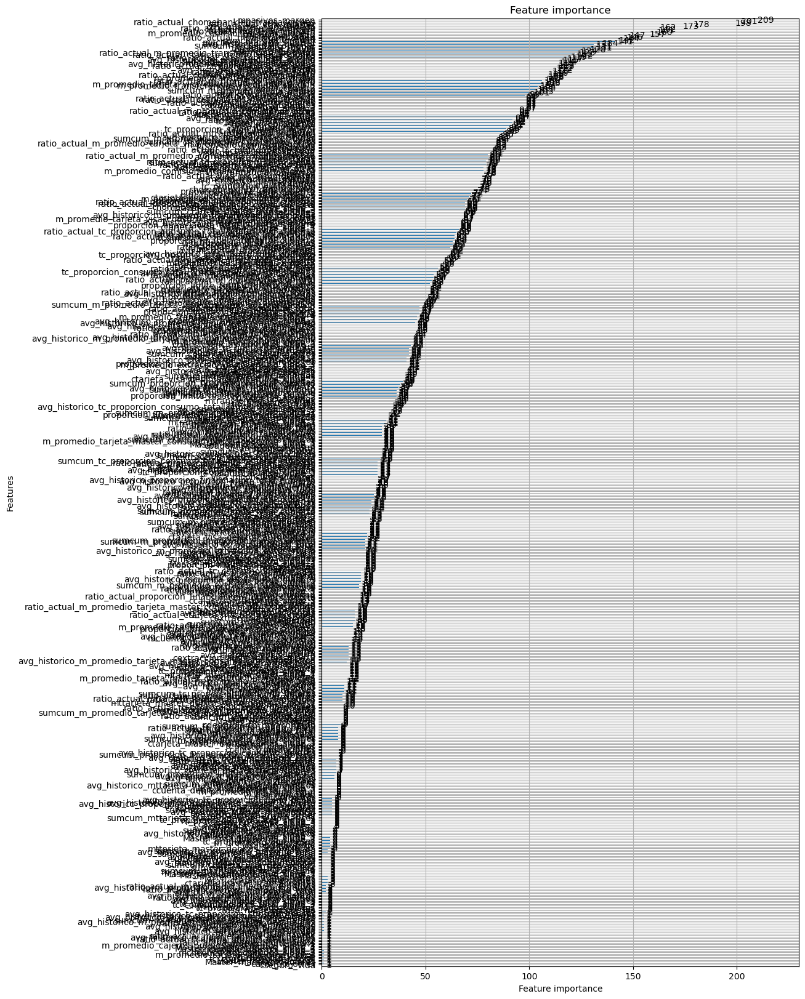

In [ ]:
#6. Observamos las variables más importantes para el modelo.
#i. Gráfico.
lgb.plot_importance(model_lgb, figsize=(10, 20))
plt.show()

In [ ]:
#ii. Dataframe.
#a. Extract feature importance and feature names.
importance = model_lgb.feature_importance()
features = model_lgb.feature_name()

#b. Create a dataframe for better visualization.
importance_df = pd.DataFrame({'Feature': features, 'Importance': importance})

#c. Sort by importance in descending order.
importance_df = importance_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)

#d. show.
importance_df
#e. Columnas a Eliminar.
cols_eliminar = importance_df[importance_df["Importance"] == 0]["Feature"].to_list()

In [ ]:
len(cols_eliminar)

59

In [ ]:
importance_df

,Feature,Importance
0,mpasivos_margen,209
1,ratio_actual_chomebanking_transacciones,201
2,ratio_actual_ctrx_quarter,198
3,ctrx_quarter,178
4,ctrx_quarter_normalizado,173
...,...,...
664,avg_historico_minversion2,0
665,sumcum_ccajeros_propios_descuentos,0
666,sumcum_mcajeros_propios_descuentos,0
667,avg_historico_mcajeros_propios_descuentos,0


In [ ]:
#7. Guardamos el modelo.
model_lgb.save_model('./lgb_datos_abril_menos_3_sin_prestamos.txt')

In [ ]:
#8. Volvemos a leer el modelo.
model_lgb = lgb.Booster(model_file="./lgb_datos_abril_menos_3_sin_prestamos.txt")

In [ ]:
api = KaggleApi()
api.authenticate()

In [ ]:
#i. Entrenamos con Abril y predecimos Junio.
#vi. Predecimos Junio.
predicciones = model_lgb.predict(X_test)
#vii. Le pegamos la probabilidad de ser "BAJA" a cada cliente.
X_test['Probabilidad'] = predicciones
#viii. Ordenamos a los clientes por probabilidad de ser "BAJA" de forma descendente.
tb_entrega = X_test.sort_values(by='Probabilidad', ascending=False)
#ix. Genero una lista de distintos cortes candidatos, para enviar a Kaggle.
cortes = range(11000,13000,500)
#x. Generamos las distintas predicciones de clases a partir de los distintos cortes posibles.
num_subida_kaggle = 1
print("--> Comienzan los envíos a Kaggle...\n")
for envios in cortes:
    #1. Le ponemos clase 1 ("BAJA") a los primeros "envios" con mayor probabilidad.
    tb_entrega['Predicted'] = 0
    tb_entrega.iloc[:envios, tb_entrega.columns.get_loc('Predicted')] = 1
    resultados = tb_entrega[["numero_de_cliente", 'Predicted']].reset_index(drop=True)

    print("Cantidad de clientes {}".format(envios))
    #2. Guardamos el archivo para Kaggle.
    nombre_archivo = "K107_EK_3_SPP_LimpCol_0{}.csv".format(num_subida_kaggle) #DF con -X meses, número de intento, número de semilla.
    ruta_archivo= "../../../exp/{}".format(nombre_archivo)
    resultados.to_csv(ruta_archivo, index=False)

    num_subida_kaggle += 1

    #3. Envío a Kaggle.
    #a. Defino los parámetros claves.
    mensaje = f'Archivo {nombre_archivo}. Abril DF sin PP. Corte:{envios}' # Datos de Train, si está con Data Drifting o no, semilla y punto de corte de prueba.
    competencia = 'dm-ey-f-2024-primera'
    #c. Subo la Submission.
    api.competition_submit(file_name=ruta_archivo, message=mensaje, competition=competencia)
    print("Submission Bien!")

--> Comienzan los envíos a Kaggle...

Cantidad de clientes 11000


100%|██████████| 2.08M/2.08M [00:01<00:00, 1.35MB/s]


Submission Bien!
Cantidad de clientes 11500


100%|██████████| 2.08M/2.08M [00:01<00:00, 1.29MB/s]


Submission Bien!
Cantidad de clientes 12000


100%|██████████| 2.08M/2.08M [00:01<00:00, 1.30MB/s]


Submission Bien!
Cantidad de clientes 12500


100%|██████████| 2.08M/2.08M [00:01<00:00, 1.30MB/s]


Submission Bien!
